# Purpose
This notebook accompanies the manuscript titled, "Parent Reflections on ABA: Analysis of 5,450 Open-Ended Responses" and submitted to *Behavior Analysis in Practice*. The notebook is structured as follows:

*   Packages and other imports that do some heavy lifting for us. 
*   Functions we'll use throughout the notebook. 
*   Reading in the data and light cleaning. 
*   Sentiment Analysis 
*   Text pre-processing
*   Bag-of-words topic modeling
*   Context-aware topic modeling
*   LDA topic modeling



# Packages and Other Imports

In [1]:
# System stuff
import warnings
warnings.filterwarnings('ignore')

# Data manipulation
import pandas as pd
import numpy as np
import string
import re
from collections import Counter
import random
import collections

# Data analysis
from scipy import stats
from scipy.stats import skew
from scipy.stats import skewtest

# Data visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.colors as mcolors
palette='gist_earth_r'

# NLP Packages
from sklearn.impute import KNNImputer
try:
  from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
except:
  !pip install vaderSentiment
  from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
try:
    import spacy
except:
    !pip install spacy
    import spacy
from spacy.lang.en import English
parser = English()
import nltk
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')
from nltk.util import ngrams
from nltk.corpus import stopwords
en_stop = set(nltk.corpus.stopwords.words('english'))
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import wordnet as wn
try:
    import gensim
except:
    !pip install gensim
    import gensim
from gensim import corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
import spacy
try:
    import pyLDAvis
except:
    !pip install pyLDAvis
    import pyLDAvis
import pyLDAvis.gensim_models
import pickle
  
# Set directory to Google Drive
from google.colab import drive
drive.mount('/content/gdrive')
%cd './gdrive/My Drive/Patient-Satisfaction-NLP/Scripts and Notebooks/'

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/My Drive/Patient-Satisfaction-NLP/Scripts and Notebooks


# Functions

### Visualizations

In [2]:
def bar_plot(x_col, y_col, data, hue=None, dodge=True, 
             x_label=None, x_rot=0, x_ticks=None, x_tick_lab=None,
             y_label=None, y_rot=0, y_ticks=None, y_tick_lab=None, y_min=0, y_max=None,
             title=None, save_name=None, palette=palette, legend=False, figsize=(10, 7), 
             ypad=125):
    """
    Parameters
    ----------
    data : TYPE
        DESCRIPTION.

    Returns
    -------
    None.
    """
    plt.figure(figsize=figsize)
    ax = sns.barplot(x=x_col, y=y_col, hue=hue, dodge=dodge,
            data=data, palette=palette)
    plt.xlabel(x_label, fontsize=30, labelpad=(24))
    plt.xticks(ticks=x_ticks, labels=x_tick_lab, fontsize=22, rotation=x_rot)
    plt.ylabel(y_label, fontsize=30, labelpad=(ypad), rotation=y_rot)
    plt.yticks(ticks=y_ticks,
               labels=y_tick_lab,
               fontsize=22)
    plt.ylim(y_min, y_max)
    plt.title(label=title, fontsize=30, pad=40)
    right_side = ax.spines["right"]
    right_side.set_visible(False)
    top = ax.spines["top"]
    top.set_visible(False)
    if legend==True:
        plt.legend(fontsize=16, loc="best")
    plt.savefig(f"../figures/{save_name}.png", bbox_inches='tight')
    plt.show()

def barplot(data,x,y,figsize,xlabel,title,ylabel, rotation=False):
    """
    Parameters
    ----------
    data : TYPE
        DESCRIPTION.

    Returns
    -------
    None.
    """
    fig, ax = plt.subplots(figsize=figsize)
    ax = sns.barplot(x=x, y=y, data=data,color='black')
    plt.xlabel('',fontsize=30,labelpad=(16))
    plt.yticks(fontsize=50)
    if rotation==True:
      plt.xticks(fontsize=50, rotation=45)
    else:
      plt.xticks(fontsize=50)
    plt.ylabel(ylabel,fontsize=35,labelpad=(16))
    plt.title(title,fontsize=70,pad=40)
    right_side=ax.spines['right']
    right_side.set_visible(False)
    top = ax.spines['top']
    top.set_visible(False)
    plt.tight_layout()
    plt.show()

def histplot(x_col, data, bins='auto', x_label=None, x_rot=0, 
             x_ticks=None, x_tick_lab=None, xmin=1, xmax=10,
              y_label=None, y_rot=0, y_ticks=None, 
             y_tick_lab=None, y_min=0, y_max=None,
              title=None, save_name=None, cum=False, 
             stat='probability', figsize=(10, 7)):
    """
    Parameters
    ----------
    data : TYPE
        DESCRIPTION.

    Returns
    -------
    None.
    """
    plt.figure(figsize=figsize)
    ax = sns.histplot(data=data, x=x_col, bins=bins, cumulative=cum, stat=stat)
    plt.xlabel(x_label, fontsize=30, labelpad=(24))
    plt.xticks(ticks=x_ticks, labels=x_tick_lab, fontsize=22, rotation=x_rot)
    plt.xlim(xmin, xmax)
    plt.ylabel(y_label, fontsize=30, labelpad=(125), rotation=y_rot)
    plt.yticks(ticks=y_ticks,
               labels=y_tick_lab,
               fontsize=22)
    plt.ylim(y_min, y_max)
    plt.title(label=title, fontsize=30, pad=40)
    right_side = ax.spines["right"]
    right_side.set_visible(False)
    top = ax.spines["top"]
    top.set_visible(False)
    plt.savefig(f"../figures/{save_name}.png", bbox_inches='tight')
    plt.show()

def line_plot(df, col, save_name):
    """
    Parameters
    ----------
    data : TYPE
        DESCRIPTION.

    Returns
    -------
    None.
    """
    plt.figure(figsize=(10, 7))
    sns.lineplot(x='topics', y=col, marker='o', 
                size=15, color='k', data=df, 
               legend=False)
    plt.ylabel(col, fontsize=24, labelpad=20)
    plt.yticks(fontsize=18)
    plt.xlabel("Topics", fontsize=24, labelpad=20)
    plt.xticks(fontsize=18)
    plt.savefig(f'../figures/{save_name}.png', bbox_inches='tight')
    plt.show()

### Text Pre-Processing

In [3]:
def remove_more_punct(text):
    """
    Parameters
    ----------
    data : TYPE
        DESCRIPTION.

    Returns
    -------
    None.
    """
    import re
    import string
    punct = set(string.punctuation)
    text = text.lower()
    text = "".join([c for c in text if c not in punct])
    text = re.sub(r"""[()\’°""#/@;¢€:£<“>{}«®`©”+=~‘|.!?,]""", "", text)
    text = re.sub(r'/[^a-zA-Z]',"",text)
    text = ' '.join(text.split())
    return text

### Data Analysis

In [49]:
def ngram_analysis(df, ngram_col, num_n=2, num_of_terms_to_display=15, title='Bigrams', figsize=(20,15)):
  """
  Parameters
  ----------
  data : TYPE
      DESCRIPTION.

  Returns
  -------
  None.
  """
  ngrams = df[ngram_col].tolist()
  ng_count = collections.Counter([x for sublist in ngrams for x in sublist])
  ngram_df = pd.DataFrame.from_dict(ng_count, orient='index').sort_values(by=[0], ascending=False).reset_index(drop=False)
  ngram_df.columns = ['index', 'count']
  ngram_df['percent'] = 100*round(ngram_df['count']/len(ngram_df), 4)
  print('\n\nLength: ', len(ngram_df))
  print(ngram_df.iloc[:15, :])
  ngram_df['ngram'] = ngram_df['index'].apply(lambda x: remove_more_punct(str(x)))
  barplot(data=ngram_df[:num_of_terms_to_display], x='count', y='ngram', figsize=figsize, xlabel='Count',
          title=title, ylabel='')
  barplot(data=ngram_df[:num_of_terms_to_display], x='percent', y='ngram', figsize=figsize, xlabel='Count',
          title=title, ylabel='', rotation=True)

def lda_model_grid(df, col):
    """
    Parameters
    ----------
    data : TYPE
        DESCRIPTION.

    Returns
    -------
    None.
    """
    df_text = []
    for i in range(len(df)):
        tokens = df[col][i]
        df_text.append(tok for tok in tokens)
        df_text.append(tokens)
    df_dict = corpora.Dictionary(df_text)
    df_corpus = [df_dict.doc2bow(text) for text in df[col]]

    # Create model and save
    topics = []
    complexity = []
    coherence = []
    for i in range(2, 11):
        print(f"Checking model with {i} topics.")
        warnings.filterwarnings('ignore')
        # Build model
        lda_model = gensim.models.ldamodel.LdaModel(corpus=df_corpus, 
                                                  id2word=df_dict, 
                                                  num_topics=i, 
                                                  random_state=100,
                                                  update_every=1, 
                                                  chunksize=1000, 
                                                  passes=10, 
                                                  alpha='auto', 
                                                  per_word_topics=True)
        # Compute complexity and coherence score
        cmplx = lda_model.log_perplexity(df_corpus)
        coherence_model_lda = CoherenceModel(model=lda_model, 
                                            texts=df[col], 
                                            dictionary=df_dict, 
                                            coherence='c_v')
        coh = coherence_model_lda.get_coherence()
        topics.append(i)
        complexity.append(cmplx)
        coherence.append(coh)

    # Save as a df
    df_df = pd.DataFrame({'topics': topics, 
                        'complexity':complexity, 
                        'coherence':coherence})
    return df_df

def lda_one_topic(df, col, topics, savename, grid_cols, fig_height=5):
    """
    Parameters
    ----------
    data : TYPE
        DESCRIPTION.

    Returns
    -------
    None.
    """
    df_text = []
    for i in range(len(df)):
        tokens = df[col][i]
        df_text.append(tok for tok in tokens)
        df_text.append(tokens)

    df_dict = corpora.Dictionary(df_text)
    df_corpus = [df_dict.doc2bow(text) for text in df[col]]

    # Build model
    lda_model = gensim.models.ldamodel.LdaModel(corpus=df_corpus, 
                                              id2word=df_dict, 
                                              num_topics=topics, 
                                              random_state=100,
                                              update_every=1, 
                                              chunksize=1000, 
                                              passes=10, 
                                              alpha='auto', 
                                              per_word_topics=True)
    lda_model.save(f'../data/07_model_output/{savename}.gensim')
    all_topics = lda_model.print_topics(num_words=20)
    all_topics = pd.DataFrame(all_topics)
    all_topics.to_csv(f'../data/07_model_output/topic_words_{savename}.csv')

    # Visualize via facet grid
    n_words = 10
    topic_words = pd.DataFrame({})
    for i, topic in enumerate(lda_model.get_topics()):
        top_feature_ids = topic.argsort()[-n_words:][::-1]
        feature_values = topic[top_feature_ids]
        words = [df_dict[id] for id in top_feature_ids]
        topic_df = pd.DataFrame({'value': feature_values, 'word': words, 'topic': i})
        topic_words = pd.concat([topic_words, topic_df], ignore_index=True)
    g = sns.FacetGrid(topic_words, col="topic", col_wrap=grid_cols*2, 
                      sharey=False, height=5, aspect=0.65)
    g.map(plt.barh, "word", "value")
    plt.ylabel("")
    plt.show()

    # Visualize via barplot
    topics_ = lda_model.show_topics(formatted=False)
    data_flat = [w for w_list in df[col] for w in w_list]
    counter = Counter(data_flat)
    out = []
    for i, topic in topics_:
        for word, weight in topic:
            out.append([word, i , weight, counter[word]])

    temp_df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(round((topics+1)/2), grid_cols, figsize=(grid_cols*8, round((topics+1)/2)*fig_height), sharey=False, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height="word_count", data=temp_df.loc[temp_df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height="importance", data=temp_df.loc[temp_df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Frequency', color=cols[i], fontsize=20)
        wc_height = temp_df['word_count'].max() + int(0.1*(temp_df['word_count'].max()))
        we_height = temp_df['importance'].max() + 0.01
        ax_twin.set_ylim(0, we_height); ax.set_ylim(0,wc_height)
        ax.set_title('Topic: ' + str(i+1), color=cols[i], fontsize=30)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(temp_df.loc[temp_df.topic_id==i, 'word'], rotation=45, horizontalalignment= 'right', fontsize=20)
        ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')
    fig.tight_layout(w_pad=2)    
    plt.show()

    # Get topic weights and dominant topics ------------
    from sklearn.manifold import TSNE
    from bokeh.plotting import figure, output_file, show
    from bokeh.models import Label
    from bokeh.io import output_notebook

    # Get topic weights
    topic_weights = []
    for i, row_list in enumerate(lda_model[df_corpus]):
        topic_weights.append([w for i, w in row_list[0]])

    # Array of topic weights    
    arr = pd.DataFrame(topic_weights).fillna(0).values

    # Keep the well separated points (optional)
    arr = arr[np.amax(arr, axis=1) > 0.35]

    # Dominant topic number in each doc
    topic_num = np.argmax(arr, axis=1)

    # tSNE Dimension Reduction
    tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
    tsne_lda = tsne_model.fit_transform(arr)

    # Plot the Topic Clusters using Bokeh
    output_notebook()
    n_topics = topics
    mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
    plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
                  plot_width=900, plot_height=700)
    plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
    show(plot)

    # Visualize using pyLDAvis
    pyLDAvis.enable_notebook()
    lda_display = pyLDAvis.gensim_models.prepare(lda_model, 
                                              df_corpus, 
                                              df_dict, 
                                              sort_topics=False)
    pyLDAvis.display(lda_display)
    pyLDAvis.save_html(lda_display, f'../figures/lda_vis_{savename}.html')
    return all_topics

# Reading in the Data

*** WARNING: This notebook is not automaticaly attached to a data source. Running these cells will lead to errors and the removal of the visuals. 

In [5]:
# Read in the raw data
all_data = pd.read_csv('../data/01_raw/all_raw_text.csv')
all_data = all_data.drop(['Unnamed: 0'], axis=1)
all_data[::910] # view every 800th row

,feedback,survey
0,Services should be provided in another facilit...,pre_COVID
910,Would like to have BIs that’s best fit for the...,pre_COVID
1820,The high turnover rate within this company is ...,pre_COVID
2730,I haven’t had staff to execute my sons treatme...,pre_COVID
3640,Since we began ABA therapy it has been a bless...,pre_COVID
4550,None,COVID


# Sentiment Analysis

In [6]:
# Lists to store the sentiment scores in
san = SentimentIntensityAnalyzer()
pos = []
neu = []
neg = []
compound = []

# Get sentiment scores from Vader Model for every open-text response
for i in range(len(all_data)):
  sent_dict = san.polarity_scores(all_data['feedback'][i])
  pos.append(sent_dict.get('pos'))
  neu.append(sent_dict.get('neu'))
  neg.append(sent_dict.get('neg'))
  compound.append(sent_dict.get('compound'))

all_data['Positive Sentiment Score'] = pos
all_data['Neutral Sentiment Score'] = neu
all_data['Negative Sentiment Score'] = neg
all_data['Overall Sentiment Score'] = compound

# Take a look
all_data[::910]

,feedback,survey,Positive Sentiment Score,Neutral Sentiment Score,Negative Sentiment Score,Overall Sentiment Score
0,Services should be provided in another facilit...,pre_COVID,0.292,0.679,0.029,0.9313
910,Would like to have BIs that’s best fit for the...,pre_COVID,0.397,0.603,0.000,0.8481
1820,The high turnover rate within this company is ...,pre_COVID,0.000,0.894,0.106,-0.6369
2730,I haven’t had staff to execute my sons treatme...,pre_COVID,0.000,1.000,0.000,0.0000
3640,Since we began ABA therapy it has been a bless...,pre_COVID,0.256,0.744,0.000,0.9509
4550,None,COVID,0.000,1.000,0.000,0.0000


## Descriptive Statistics

In [7]:
# Describe
all_data.describe()

,Positive Sentiment Score,Neutral Sentiment Score,Negative Sentiment Score,Overall Sentiment Score
count,5450.000000,5450.00000,5450.000000,5450.000000
mean,0.195147,0.69739,0.107465,0.408591
std,0.179810,0.26181,0.269467,0.501038
min,0.000000,0.00000,0.000000,-0.985500
25%,0.000000,0.62100,0.000000,0.000000
50%,0.172000,0.75900,0.000000,0.585900
75%,0.303000,0.86000,0.065000,0.851100
max,1.000000,1.00000,1.000000,0.997400


In [8]:
# Proportion of responses counted as positive and negative
print("Proportion Positive: ", round((len(all_data[all_data['Overall Sentiment Score']>=0.50])/len(all_data)), 2))
print("Proportion Negative: ", round((len(all_data[all_data['Overall Sentiment Score']<=-0.50])/len(all_data)), 2))

Proportion Positive:  0.54
Proportion Negative:  0.05


In [9]:
temp_df = all_data[all_data['Overall Sentiment Score']>=0]
temp_df = temp_df[temp_df['Overall Sentiment Score']<=0.5]
print("Proportion Neutral: ", round((len(temp_df)/len(all_data)), 2))

Proportion Neutral:  0.26


In [10]:
26/41

0.6341463414634146

In [11]:
# Print statistical tests of skewness for the sentiment distributions
for i in ['Positive Sentiment Score', 'Negative Sentiment Score', 
         'Neutral Sentiment Score', 'Overall Sentiment Score']:
    temp_df = all_data[i]
    print(i, skew(temp_df), '\n', skewtest(temp_df), '\n')

Positive Sentiment Score 0.9455576838978021 
 SkewtestResult(statistic=24.3787807862047, pvalue=2.8719488555230876e-131) 

Negative Sentiment Score 2.8808730701147476 
 SkewtestResult(statistic=48.681346929161215, pvalue=0.0) 

Neutral Sentiment Score -1.4226244039697806 
 SkewtestResult(statistic=-32.601926957857586, pvalue=3.8512763167254153e-233) 

Overall Sentiment Score -0.6842772488114535 
 SkewtestResult(statistic=-18.786002666093417, pvalue=9.831161641885936e-79) 



## Visualizations

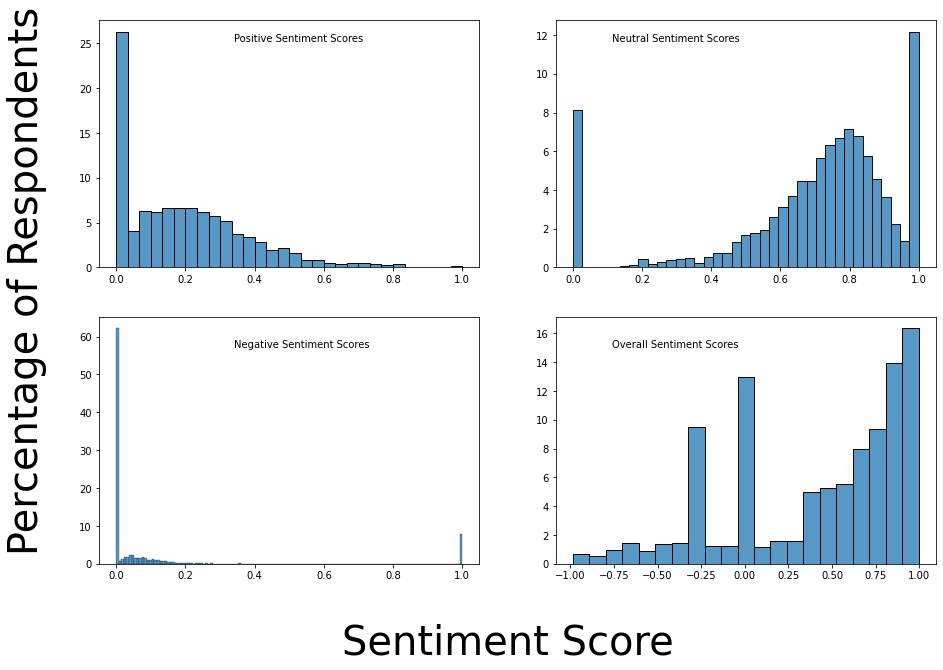

In [12]:
# Histograms of each 
# Quick plots of Vader sentiment before and after
fig, axs = plt.subplots(2, 2, figsize=(15, 10), sharey=False, sharex=False)
sns.histplot(x=all_data['Positive Sentiment Score'], ax=axs[0, 0], stat='percent')
sns.histplot(x=all_data['Neutral Sentiment Score'], ax=axs[0, 1], stat='percent')
sns.histplot(x=all_data['Negative Sentiment Score'], ax=axs[1, 0], stat='percent')
sns.histplot(x=all_data['Overall Sentiment Score'], ax=axs[1, 1], stat='percent')

# Upper left plot
axs[0, 0].set_ylabel('')
axs[0, 0].set_xlabel('')
fig.text(0.25, 0.85, 'Positive Sentiment Scores')

# Upper right plot
axs[0, 1].set_ylabel('')
axs[0, 1].set_xlabel('')
fig.text(0.6, 0.85, 'Neutral Sentiment Scores')

# Lower left plot
axs[1, 0].set_ylabel('')
axs[1, 1].set_ylabel('')
fig.text(0.25, 0.425, 'Negative Sentiment Scores')

# Lower right plot
axs[1, 0].set_xlabel('')
axs[1, 1].set_xlabel('')
fig.text(.6, 0.425, 'Overall Sentiment Scores')

# Main plot
fig.text(0.35, 0.0, 'Sentiment Score', fontsize=40)
fig.text(0.04, 0.15, 'Percentage of Respondents', fontsize=40, rotation='vertical')

# Save it
plt.savefig(fname='../figures/hist_vader.png', bbox_inches='tight')

# Show it
plt.show()

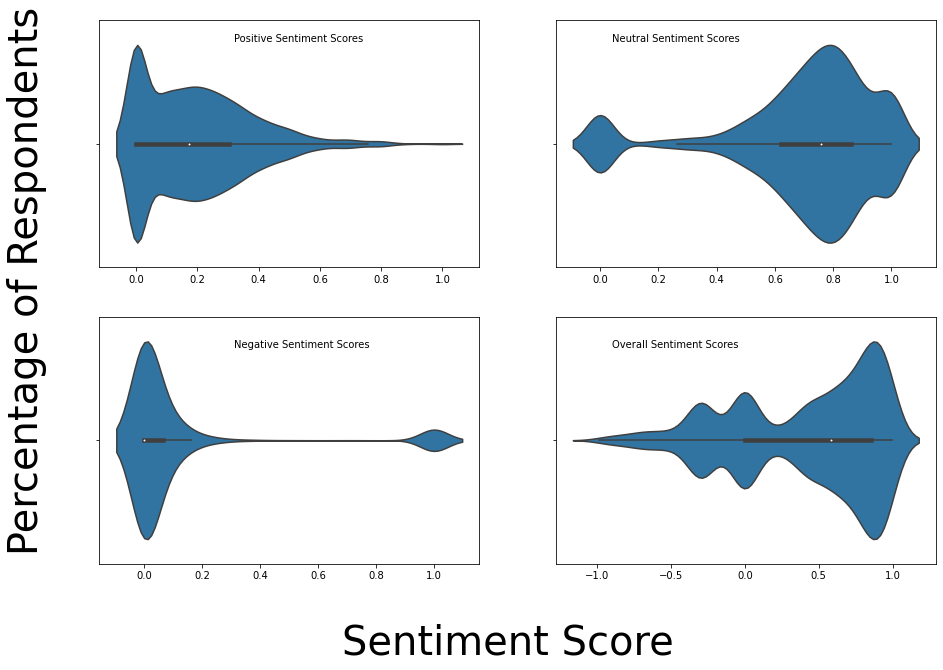

In [13]:
# Violinplot of each 
# Quick plots of Vader sentiment before and after
fig, axs = plt.subplots(2, 2, figsize=(15, 10), sharey=False, sharex=False)
sns.violinplot(x=all_data['Positive Sentiment Score'], ax=axs[0, 0], stat='percentage')
sns.violinplot(x=all_data['Neutral Sentiment Score'], ax=axs[0, 1], stat='percentage')
sns.violinplot(x=all_data['Negative Sentiment Score'], ax=axs[1, 0], stat='percentage')
sns.violinplot(x=all_data['Overall Sentiment Score'], ax=axs[1, 1], stat='percentage')

# Upper left plot
axs[0, 0].set_ylabel('')
axs[0, 0].set_xlabel('')
fig.text(0.25, 0.85, 'Positive Sentiment Scores')

# Upper right plot
axs[0, 1].set_ylabel('')
axs[0, 1].set_xlabel('')
fig.text(0.6, 0.85, 'Neutral Sentiment Scores')

# Lower left plot
axs[1, 0].set_ylabel('')
axs[1, 1].set_ylabel('')
fig.text(0.25, 0.425, 'Negative Sentiment Scores')

# Lower right plot
axs[1, 0].set_xlabel('')
axs[1, 1].set_xlabel('')
fig.text(.6, 0.425, 'Overall Sentiment Scores')

# Main plot
fig.text(0.35, 0.0, 'Sentiment Score', fontsize=40)
fig.text(0.04, 0.15, 'Percentage of Respondents', fontsize=40, rotation='vertical')

# Save it
plt.savefig(fname='../figures/violin_vader.png', bbox_inches='tight')

# Show it
plt.show()

# Text Pre-Processing

## Standard pre-processing steps

In [14]:
# Make sure everything in the col is showing as a string
all_data['feedback'] = all_data['feedback'].astype(str)

# Lower case all text
all_data['feedback_clean'] = all_data['feedback'].str.lower()
all_data[::910]

,feedback,survey,Positive Sentiment Score,Neutral Sentiment Score,Negative Sentiment Score,Overall Sentiment Score,feedback_clean
0,Services should be provided in another facilit...,pre_COVID,0.292,0.679,0.029,0.9313,services should be provided in another facilit...
910,Would like to have BIs that’s best fit for the...,pre_COVID,0.397,0.603,0.000,0.8481,would like to have bis that’s best fit for the...
1820,The high turnover rate within this company is ...,pre_COVID,0.000,0.894,0.106,-0.6369,the high turnover rate within this company is ...
2730,I haven’t had staff to execute my sons treatme...,pre_COVID,0.000,1.000,0.000,0.0000,i haven’t had staff to execute my sons treatme...
3640,Since we began ABA therapy it has been a bless...,pre_COVID,0.256,0.744,0.000,0.9509,since we began aba therapy it has been a bless...
4550,None,COVID,0.000,1.000,0.000,0.0000,none


In [15]:
# Remove stopwords
stop_words = stopwords.words('english') + ['albert', 'centria', 'lauren', 'julien', 'sonnenberg', 'kailee', 'ahss', 'moments', 'bca', 'nov 06 2019', 'evan'] # Add some troublesome words to remove
all_data['feedback_clean'] = all_data['feedback_clean'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
all_data[::910]

,feedback,survey,Positive Sentiment Score,Neutral Sentiment Score,Negative Sentiment Score,Overall Sentiment Score,feedback_clean
0,Services should be provided in another facilit...,pre_COVID,0.292,0.679,0.029,0.9313,services provided another facility accommodate...
910,Would like to have BIs that’s best fit for the...,pre_COVID,0.397,0.603,0.000,0.8481,would like bis that’s best fit child depending...
1820,The high turnover rate within this company is ...,pre_COVID,0.000,0.894,0.106,-0.6369,high turnover rate within company problematic ...
2730,I haven’t had staff to execute my sons treatme...,pre_COVID,0.000,1.000,0.000,0.0000,haven’t staff execute sons treatment plan yet
3640,Since we began ABA therapy it has been a bless...,pre_COVID,0.256,0.744,0.000,0.9509,since began aba therapy blessing family. great...
4550,None,COVID,0.000,1.000,0.000,0.0000,none


In [16]:
# Handle variations present in our text the nltk algorithms don't catch out-of-the-box
punct = set(string.punctuation)
fdbk_cln = []
for i in range(len(all_data)):
  save_list = []
  temp_list = all_data['feedback_clean'][i]
  temp_list = temp_list.replace('team.', 'team')
  temp_list = temp_list.replace('son\'s', 'son')
  temp_list = temp_list.replace('family.', 'family')
  temp_list = temp_list.replace('getting', 'get')
  temp_list = temp_list.replace('receiving', 'receive')
  temp_list = temp_list.replace('training', 'train')
  temp_list = temp_list.replace('there.', 'there')
  temp_list = temp_list.replace('program.', 'program')
  temp_list = temp_list.replace('months.', 'month')
  temp_list = temp_list.replace('provider.', 'provider')
  temp_list = temp_list.replace('son.', 'son')
  temp_list = temp_list.replace('sons', 'son')
  temp_list = temp_list.replace('therapists.', 'therapist')
  temp_list = temp_list.replace('worked', 'work')
  temp_list = temp_list.replace('therapists', 'therapist')
  temp_list = temp_list.replace('son', 'child')
  temp_list = temp_list.replace('daughter', 'child')
  temp_list = temp_list.replace('moments', '')

  for ele in punct:
    temp_list = temp_list.replace(ele, '')
  fdbk_cln.append(temp_list)

# Add clean data to the all_data df
all_data['feedback_clean'] = fdbk_cln
all_data[::910]

,feedback,survey,Positive Sentiment Score,Neutral Sentiment Score,Negative Sentiment Score,Overall Sentiment Score,feedback_clean
0,Services should be provided in another facilit...,pre_COVID,0.292,0.679,0.029,0.9313,services provided another facility accommodate...
910,Would like to have BIs that’s best fit for the...,pre_COVID,0.397,0.603,0.000,0.8481,would like bis that’s best fit child depending...
1820,The high turnover rate within this company is ...,pre_COVID,0.000,0.894,0.106,-0.6369,high turnover rate within company problematic ...
2730,I haven’t had staff to execute my sons treatme...,pre_COVID,0.000,1.000,0.000,0.0000,haven’t staff execute child treatment plan yet
3640,Since we began ABA therapy it has been a bless...,pre_COVID,0.256,0.744,0.000,0.9509,since began aba therapy blessing family great ...
4550,None,COVID,0.000,1.000,0.000,0.0000,none


In [17]:
# Remove top 10% most common words
' '.join(fdbk_cln)
new_str = ''
for i in range(len(fdbk_cln)):
  new_str = new_str + fdbk_cln[i]
all_words = nltk.tokenize.word_tokenize(new_str)
all_word_dist = nltk.FreqDist(w.lower() for w in all_words)
cutoff = int(len(all_word_dist)*0.1)
most_common = all_word_dist.most_common(cutoff)
most_common.extend(['ve', 'll'])
all_data['feedback_trimmed'] = all_data['feedback_clean'].apply(lambda x: ' '.join([word for word in x.split() if word not in (most_common)]))

# Tokenize text
all_data['feedback_trimmed'] = all_data['feedback_trimmed'].apply(lambda x: x.split())
all_data[::910]

,feedback,survey,Positive Sentiment Score,Neutral Sentiment Score,Negative Sentiment Score,Overall Sentiment Score,feedback_clean,feedback_trimmed
0,Services should be provided in another facilit...,pre_COVID,0.292,0.679,0.029,0.9313,services provided another facility accommodate...,"[services, provided, another, facility, accomm..."
910,Would like to have BIs that’s best fit for the...,pre_COVID,0.397,0.603,0.000,0.8481,would like bis that’s best fit child depending...,"[would, like, bis, that’s, best, fit, child, d..."
1820,The high turnover rate within this company is ...,pre_COVID,0.000,0.894,0.106,-0.6369,high turnover rate within company problematic ...,"[high, turnover, rate, within, company, proble..."
2730,I haven’t had staff to execute my sons treatme...,pre_COVID,0.000,1.000,0.000,0.0000,haven’t staff execute child treatment plan yet,"[haven’t, staff, execute, child, treatment, pl..."
3640,Since we began ABA therapy it has been a bless...,pre_COVID,0.256,0.744,0.000,0.9509,since began aba therapy blessing family great ...,"[since, began, aba, therapy, blessing, family,..."
4550,None,COVID,0.000,1.000,0.000,0.0000,none,[none]


## Getting bigrams and trigrams ready

In [18]:
# Lists to store our ngram tokens
bigrams = []
trigrams = []

# Loop through the dataset and get bigrams and trigrams for each open-text response
for i in range(len(all_data)):
  text = all_data['feedback_trimmed'][i]            # Isolate the response we're interested in
  
  # Get bigrams if there are enough words available
  try:
    bg = [' '.join(e) for e in ngrams(text, 2)]
  except:
    bg = []                                     
  bigrams.append(bg)
  
  # Get trigrams if there are enough words available
  try:
    tg = [' '.join(e) for e in ngrams(text, 3)]
  except:
    tg = []
  trigrams.append(tg)

# Add lists to our working dataframe
all_data['feedback_bigram'] = bigrams
all_data['feedback_trigram'] = trigrams

# Save it
all_data.to_csv('../data/04_feature/cleaned_text_with_features.csv')

# View it
all_data[::910]

,feedback,survey,Positive Sentiment Score,Neutral Sentiment Score,Negative Sentiment Score,Overall Sentiment Score,feedback_clean,feedback_trimmed,feedback_bigram,feedback_trigram
0,Services should be provided in another facilit...,pre_COVID,0.292,0.679,0.029,0.9313,services provided another facility accommodate...,"[services, provided, another, facility, accomm...","[services provided, provided another, another ...","[services provided another, provided another f..."
910,Would like to have BIs that’s best fit for the...,pre_COVID,0.397,0.603,0.000,0.8481,would like bis that’s best fit child depending...,"[would, like, bis, that’s, best, fit, child, d...","[would like, like bis, bis that’s, that’s best...","[would like bis, like bis that’s, bis that’s b..."
1820,The high turnover rate within this company is ...,pre_COVID,0.000,0.894,0.106,-0.6369,high turnover rate within company problematic ...,"[high, turnover, rate, within, company, proble...","[high turnover, turnover rate, rate within, wi...","[high turnover rate, turnover rate within, rat..."
2730,I haven’t had staff to execute my sons treatme...,pre_COVID,0.000,1.000,0.000,0.0000,haven’t staff execute child treatment plan yet,"[haven’t, staff, execute, child, treatment, pl...","[haven’t staff, staff execute, execute child, ...","[haven’t staff execute, staff execute child, e..."
3640,Since we began ABA therapy it has been a bless...,pre_COVID,0.256,0.744,0.000,0.9509,since began aba therapy blessing family great ...,"[since, began, aba, therapy, blessing, family,...","[since began, began aba, aba therapy, therapy ...","[since began aba, began aba therapy, aba thera..."
4550,None,COVID,0.000,1.000,0.000,0.0000,none,[none],[],[]


In [19]:
# Create dataframe with a trimmed down version of the cols we need
df = pd.DataFrame({'feedback':all_data['feedback_trimmed'], 
                   'bigrams':all_data['feedback_bigram'], 
                   'trigrams':all_data['feedback_trigram'], 
                   'sentiment':all_data['Overall Sentiment Score']})
df = df[df['feedback'].map(lambda d: len(d)) > 0]
df = df.reset_index(drop=True)
# Make sure the cols are numeric
df['sentiment'] = df['sentiment'].astype(float)
df[::875]

,feedback,bigrams,trigrams,sentiment
0,"[services, provided, another, facility, accomm...","[services provided, provided another, another ...","[services provided another, provided another f...",0.9313
875,"[mostly, satisfied, life, strategies, would, l...","[mostly satisfied, satisfied life, life strate...","[mostly satisfied life, satisfied life strateg...",0.8685
1750,"[child, consultant, good, knowledge, job, neve...","[child consultant, consultant good, good knowl...","[child consultant good, consultant good knowle...",0.1265
2625,"[level, bcba, techs, affecting, consistency, t...","[level bcba, bcba techs, techs affecting, affe...","[level bcba techs, bcba techs affecting, techs...",-0.5574
3500,"[everyone, friendly]",[everyone friendly],[],0.5838
4375,[none],[],[],0.0000


In [20]:
# Cleaning out some sticklers
remove_list = ['nov 06 2019', 'south suburbs needs', 'side chicago south', 'south side chicago', 
               'suburbs needs open', 'center south side', 'need center south', 'something south partner', 
               'south partner existing', 'chicago south suburbs']
new_col = []
for i in range(len(df)):
  temp_list = []
  sent = df['trigrams'][i]
  for word in sent:
    if word in remove_list:
      continue
    else:
      temp_list.append(word)
  new_col.append(temp_list)
df['trigram_clean'] = new_col
df[::875]

,feedback,bigrams,trigrams,sentiment,trigram_clean
0,"[services, provided, another, facility, accomm...","[services provided, provided another, another ...","[services provided another, provided another f...",0.9313,"[services provided another, provided another f..."
875,"[mostly, satisfied, life, strategies, would, l...","[mostly satisfied, satisfied life, life strate...","[mostly satisfied life, satisfied life strateg...",0.8685,"[mostly satisfied life, satisfied life strateg..."
1750,"[child, consultant, good, knowledge, job, neve...","[child consultant, consultant good, good knowl...","[child consultant good, consultant good knowle...",0.1265,"[child consultant good, consultant good knowle..."
2625,"[level, bcba, techs, affecting, consistency, t...","[level bcba, bcba techs, techs affecting, affe...","[level bcba techs, bcba techs affecting, techs...",-0.5574,"[level bcba techs, bcba techs affecting, techs..."
3500,"[everyone, friendly]",[everyone friendly],[],0.5838,[]
4375,[none],[],[],0.0000,[]


## Separate out positive and negative responses from all responses

In [21]:
# Create positive and negative dfs
pos_df = df[df['sentiment']>=0.50]
pos_df = pos_df.reset_index(drop=True)
neg_df = df[df['sentiment']<=-0.50]
neg_df = neg_df.reset_index(drop=True)

# Bag-of-Words Topic Modeling



Length:  6745
        index  count  percent
0       child   3049    45.20
1   therapist   1288    19.10
2       would    758    11.24
3         aba    753    11.16
4       staff    733    10.87
5      family    634     9.40
6    services    630     9.34
7        team    610     9.04
8        work    601     8.91
9        time    584     8.66
10      great    556     8.24
11    therapy    531     7.87
12    amazing    528     7.83
13        get    506     7.50
14       like    502     7.44


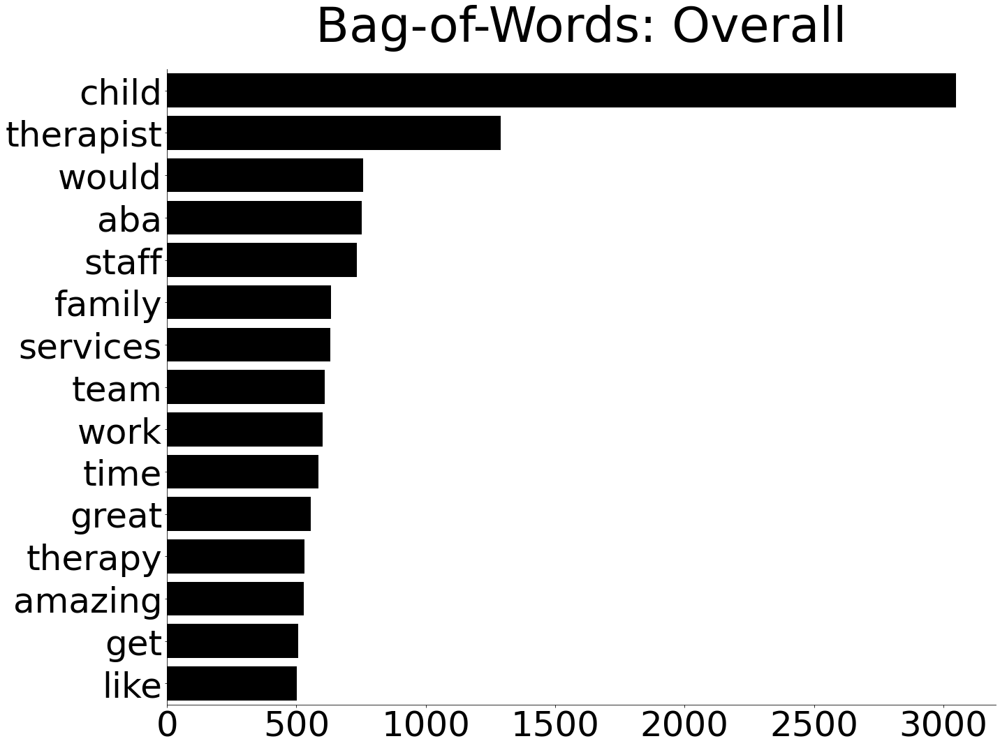

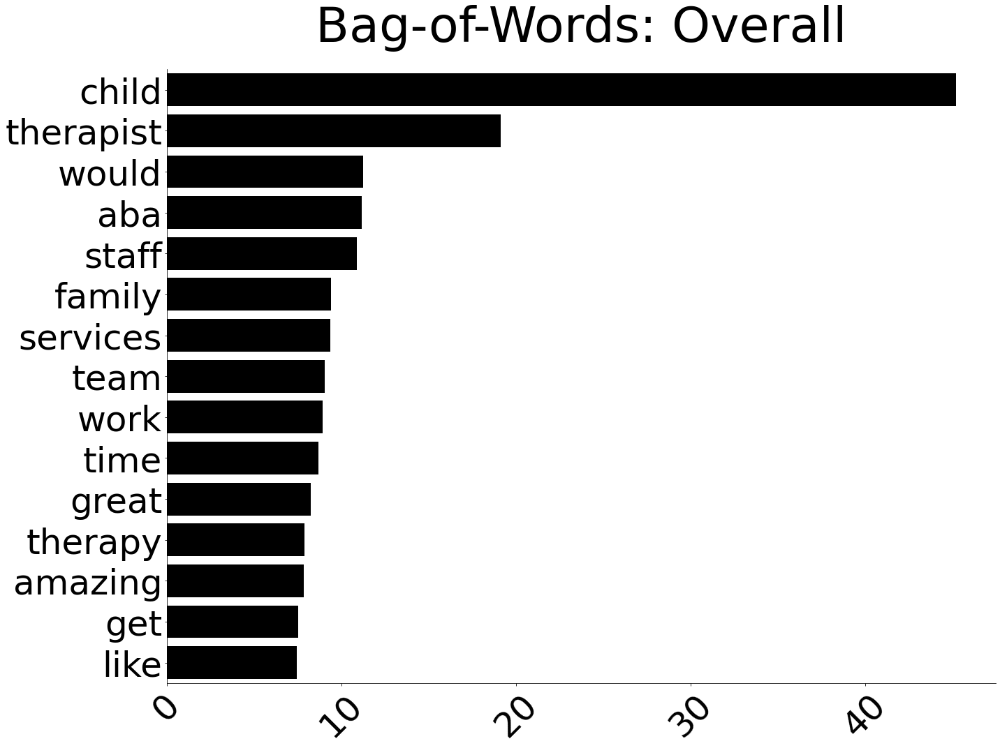



Length:  5215
        index  count  percent
0       child   2177    41.74
1   therapist    748    14.34
2       would    529    10.14
3       great    520     9.97
4         aba    518     9.93
5       staff    517     9.91
6      family    511     9.80
7     amazing    500     9.59
8        team    475     9.11
9        love    436     8.36
10       work    420     8.05
11   progress    390     7.48
12   services    374     7.17
13      happy    353     6.77
14       like    334     6.40


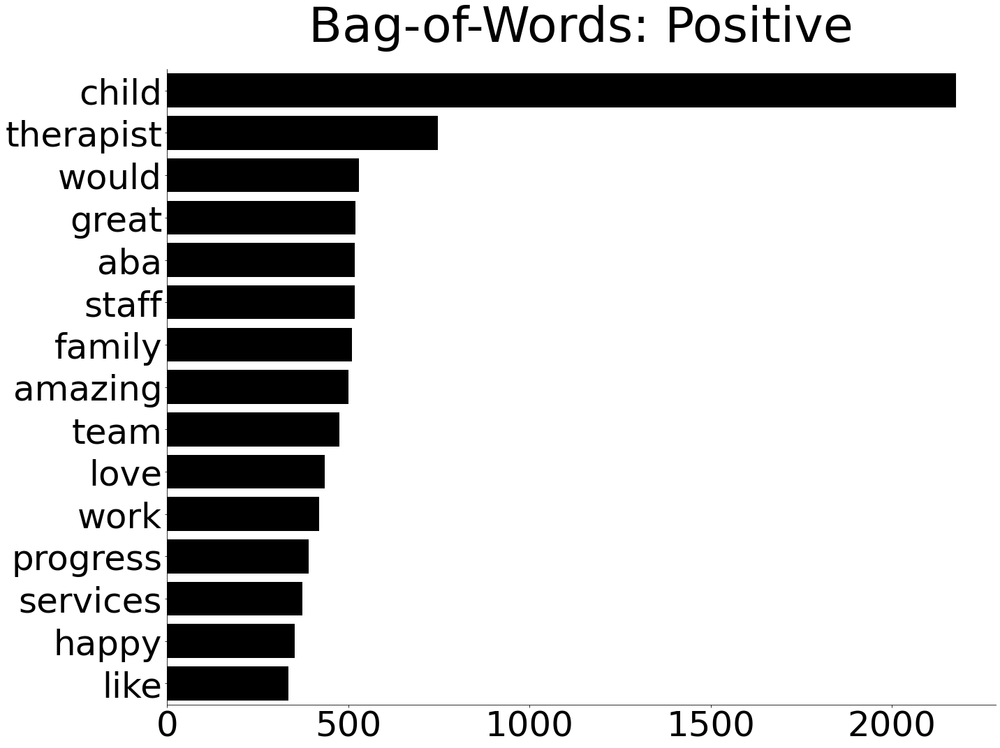

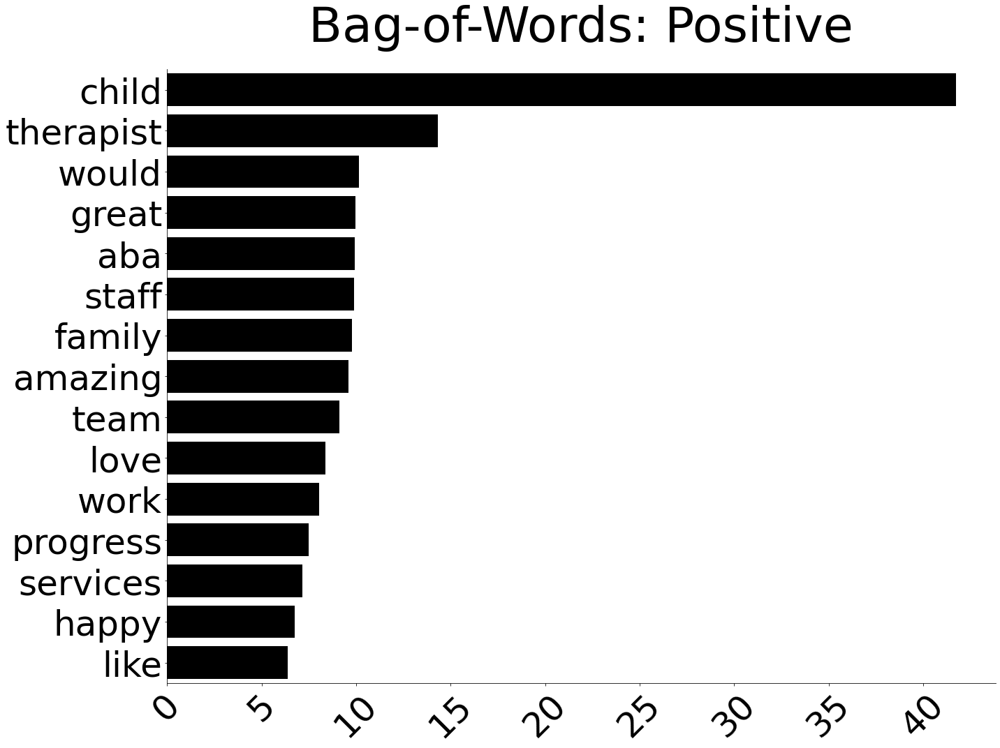



Length:  2081
        index  count  percent
0       child    269    12.93
1   therapist    199     9.56
2         one     96     4.61
3        time     91     4.37
4         new     87     4.18
5         get     85     4.08
6       hours     84     4.04
7    services     83     3.99
8          us     78     3.75
9       staff     74     3.56
10    billing     69     3.32
11      never     56     2.69
12       also     55     2.64
13      would     55     2.64
14       bcba     53     2.55


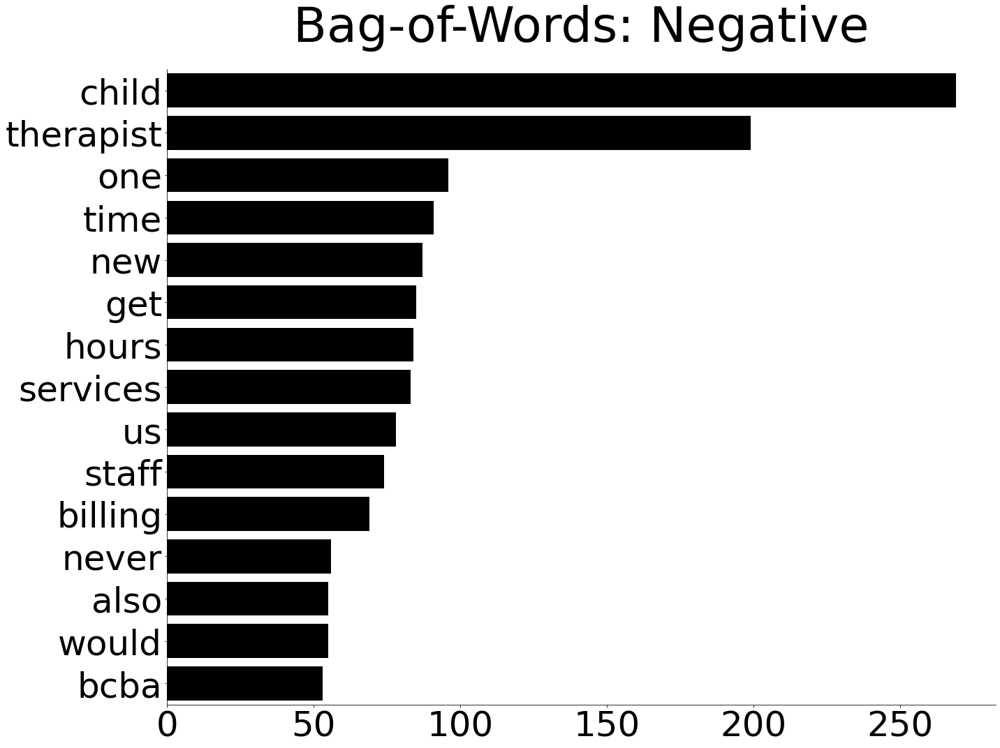

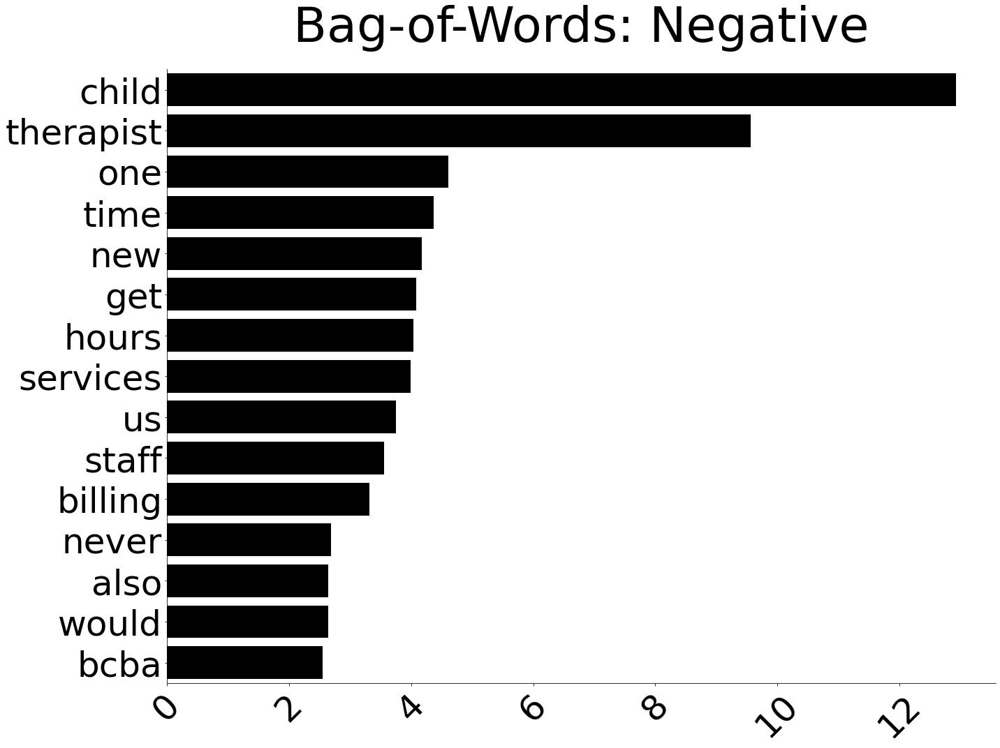

In [22]:
# All Unigrams
ngram_analysis(df=df, ngram_col='feedback', num_n=1, title='Bag-of-Words: Overall')

# Positive
ngram_analysis(df=pos_df, ngram_col='feedback', num_n=1, title='Bag-of-Words: Positive')

# Negative
ngram_analysis(df=neg_df, ngram_col='feedback', num_n=1, title='Bag-of-Words: Negative')

# Context-Aware Topic Modeling

## Bigrams



Length:  42322
             index  count  percent
0       would like    156     0.37
1       child made    122     0.29
2     child family    114     0.27
3        feel like     91     0.22
4      aba therapy     84     0.20
5       help child     68     0.16
6        thank you     65     0.15
7   since starting     65     0.15
8    aba therapist     63     0.15
9       care child     61     0.14
10     child loves     58     0.14
11    parent train     57     0.13
12    aba services     56     0.13
13   since started     55     0.13
14   child receive     54     0.13


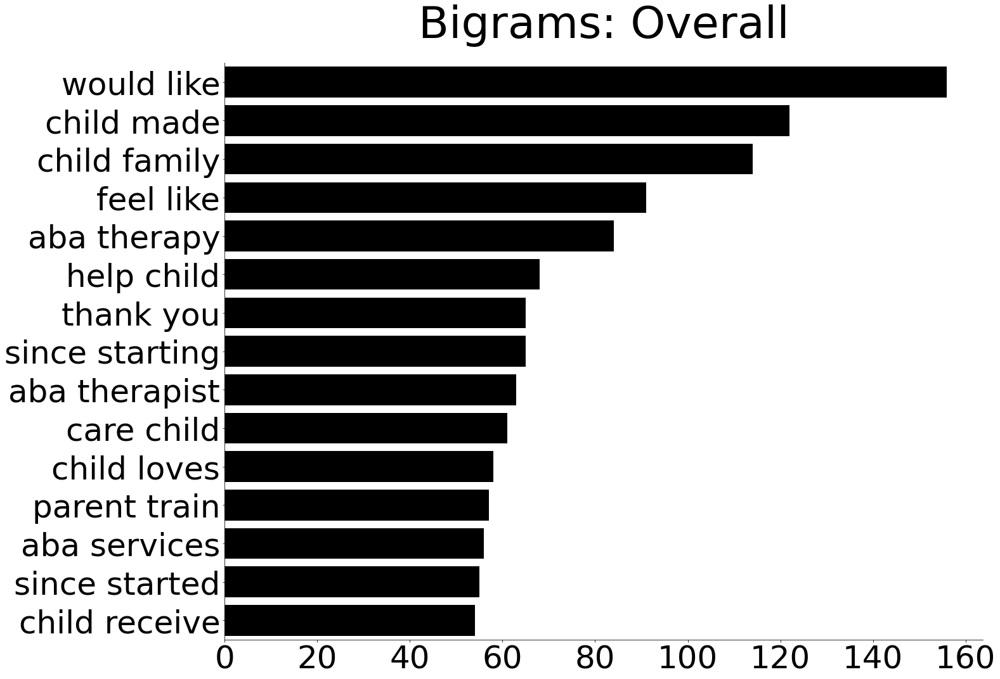

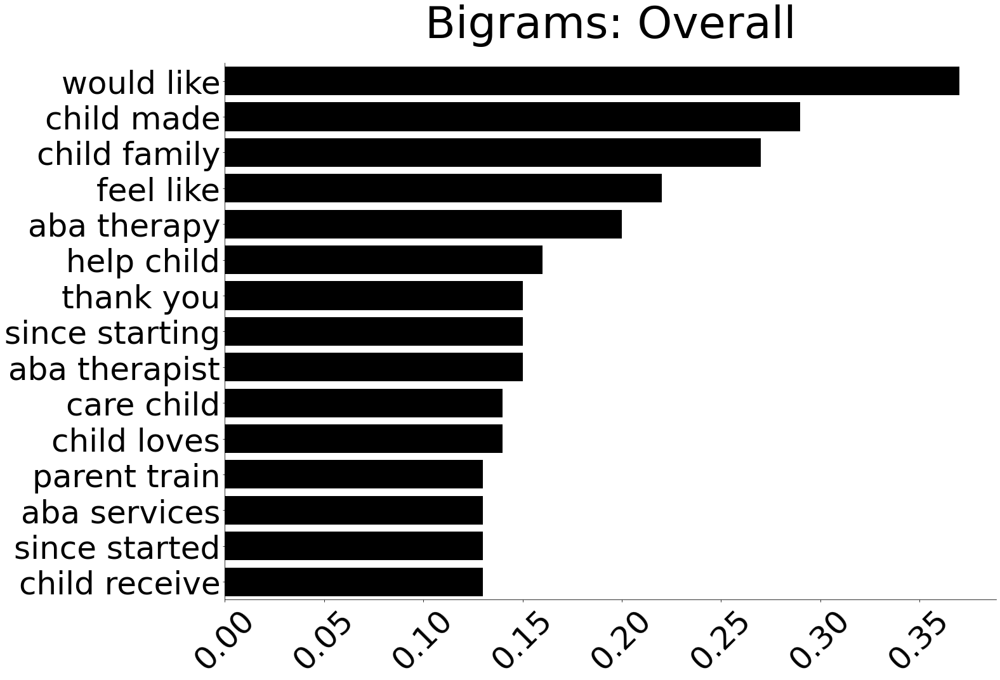



Length:  28444
             index  count  percent
0       child made    107     0.38
1       would like    106     0.37
2     child family     99     0.35
3      aba therapy     64     0.23
4        feel like     60     0.21
5      child loves     56     0.20
6       care child     54     0.19
7       help child     53     0.19
8        work with     51     0.18
9        thank you     49     0.17
10  since starting     45     0.16
11    parent train     44     0.15
12      great team     41     0.14
13   since started     41     0.14
14  progress child     40     0.14


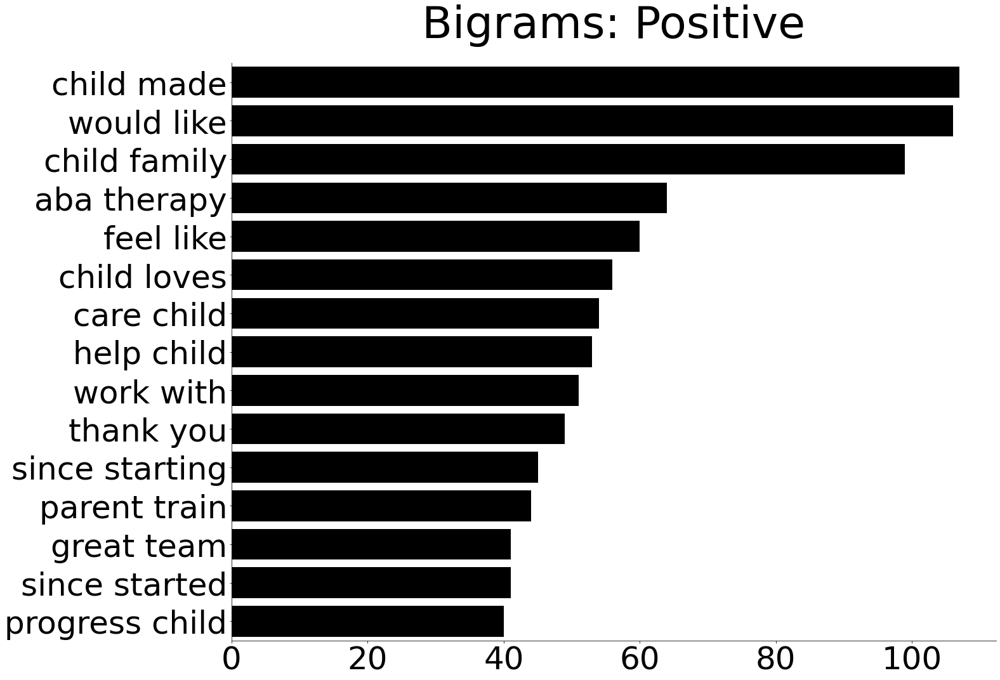

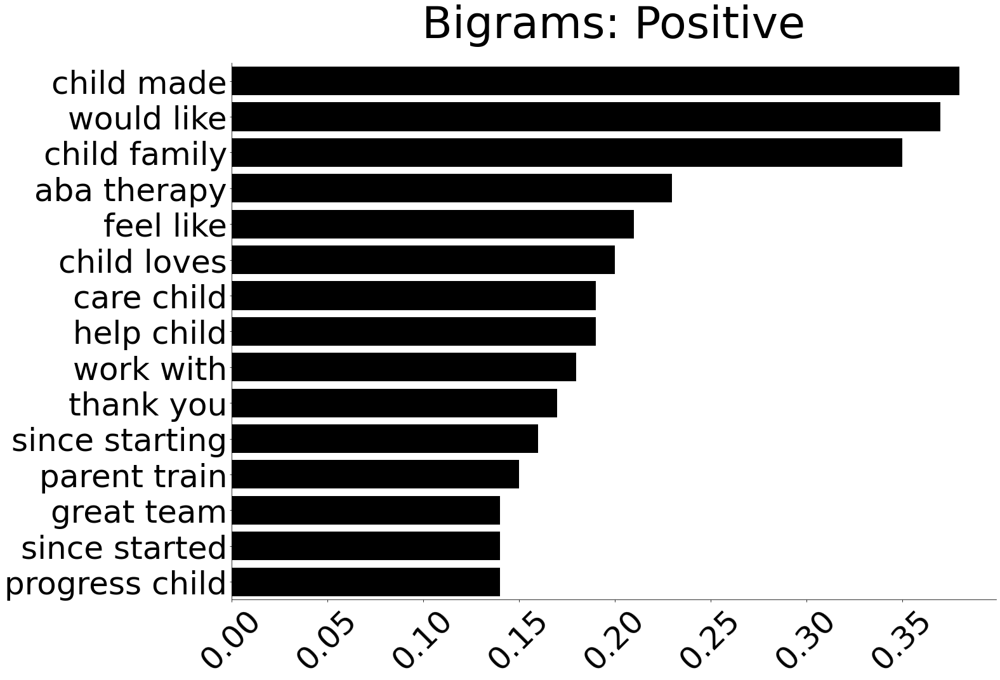



Length:  5974
                  index  count  percent
0    billing department     25     0.42
1         new therapist     16     0.27
2         high turnover     10     0.17
3           even though      9     0.15
4        services child      9     0.15
5          payment plan      8     0.13
6    lack communication      8     0.13
7       therapist child      8     0.13
8   secondary insurance      8     0.13
9             get child      7     0.12
10           many times      7     0.12
11    disappointed lack      7     0.12
12            last year      7     0.12
13             year old      7     0.12
14            two weeks      7     0.12


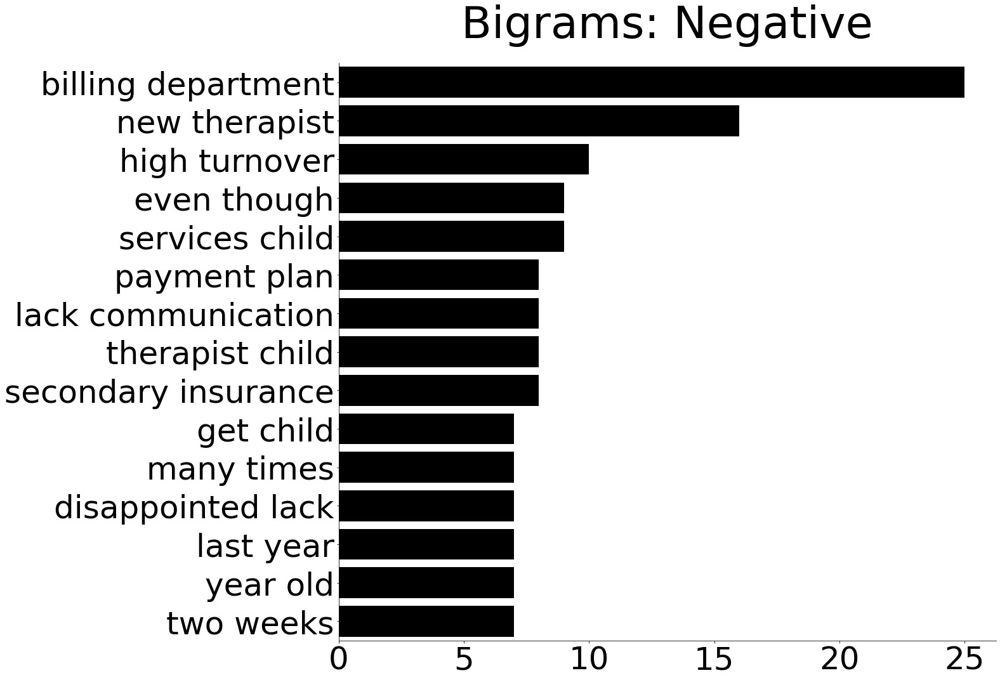

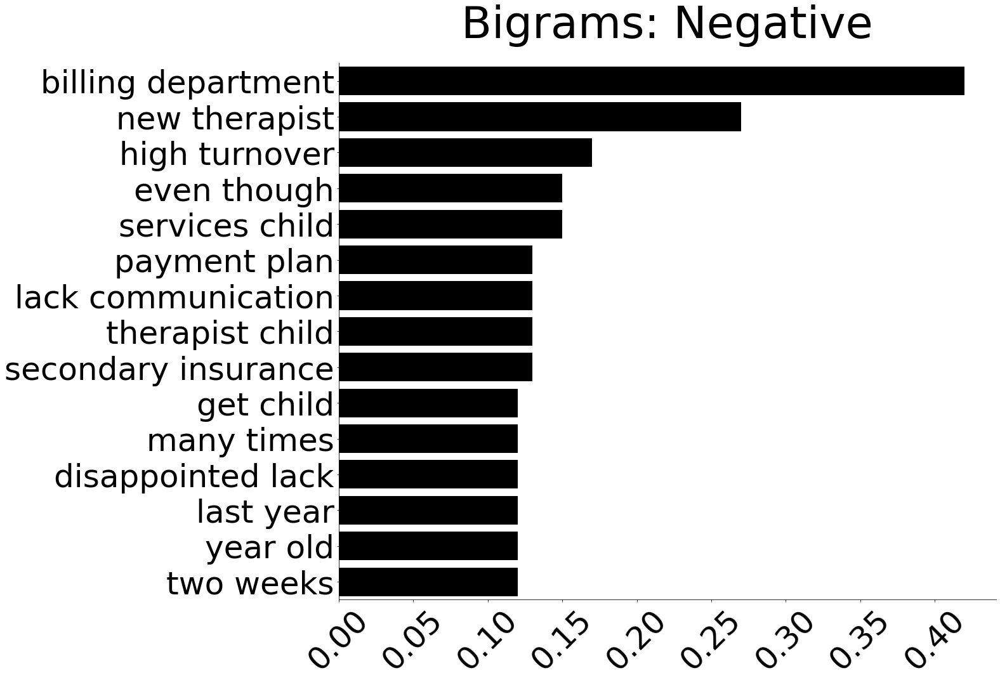

In [23]:
# All Bigrams
ngram_analysis(df=df, ngram_col='bigrams', num_n=1, title='Bigrams: Overall', figsize=(22, 15))

# Positive
ngram_analysis(df=pos_df, ngram_col='bigrams', num_n=1, title='Bigrams: Positive', figsize=(22, 15))

# Negative
ngram_analysis(df=neg_df, ngram_col='bigrams', num_n=1, title='Bigrams: Negative', figsize=(22, 15))

## Trigrams



Length:  51238
                     index  count  percent
0           would like see     38     0.07
1       know would without     25     0.05
2      progress child made     23     0.04
3       since starting aba     20     0.04
4       would without them     20     0.04
5         child made great     16     0.03
6      made great progress     16     0.03
7       made much progress     16     0.03
8         don’t know would     15     0.03
9       high turnover rate     15     0.03
10          hours per week     15     0.03
11         cant say enough     13     0.03
12         say enough good     12     0.02
13  would highly recommend     12     0.02
14       child loves going     11     0.02


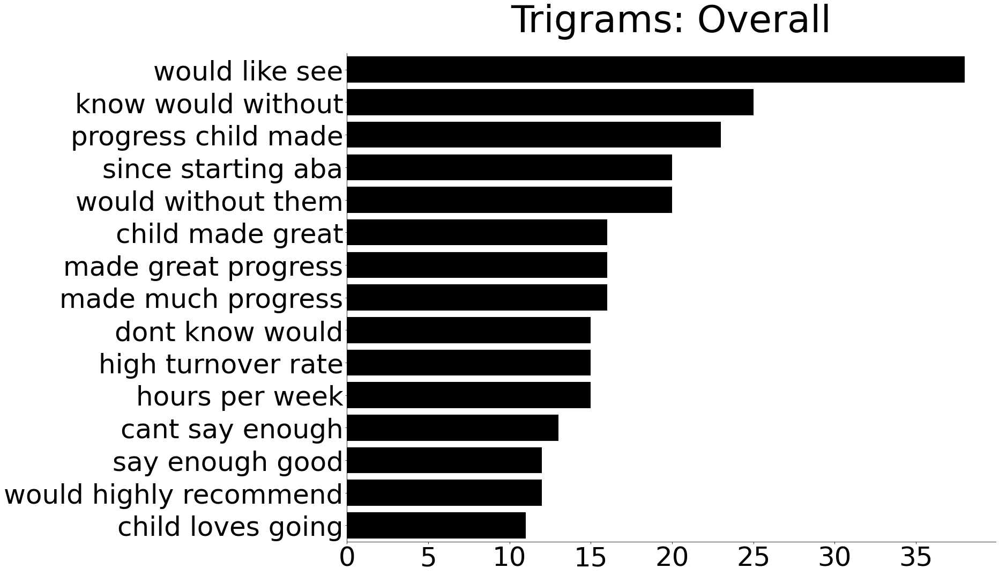

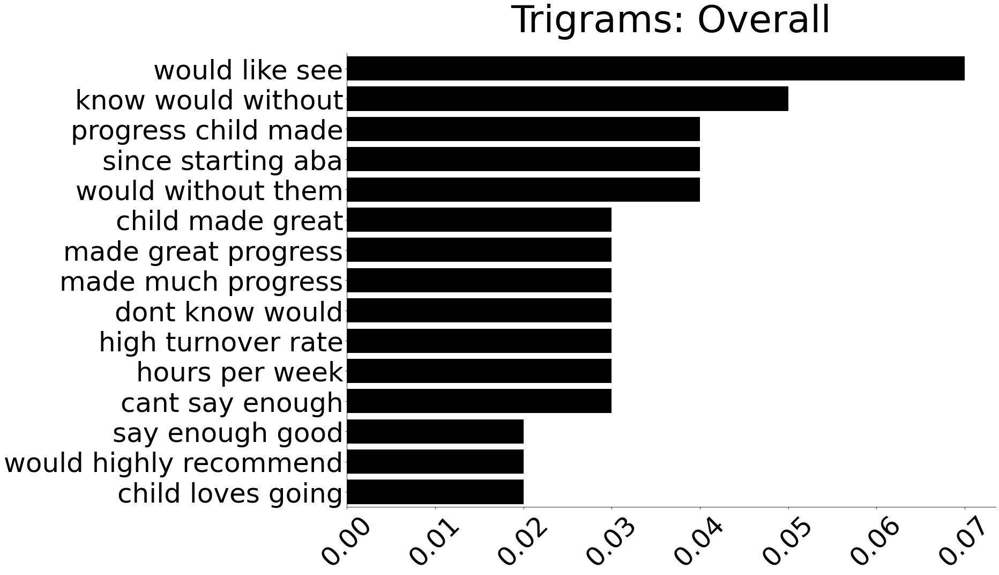



Length:  34076
                     index  count  percent
0           would like see     27     0.08
1       know would without     25     0.07
2      progress child made     23     0.07
3       would without them     20     0.06
4         child made great     16     0.05
5      made great progress     16     0.05
6         don’t know would     15     0.04
7       since starting aba     15     0.04
8       made much progress     12     0.04
9          say enough good     11     0.03
10          would love see     11     0.03
11        can’t say enough     10     0.03
12         cant say enough     10     0.03
13       child loves going      9     0.03
14  child receive services      9     0.03


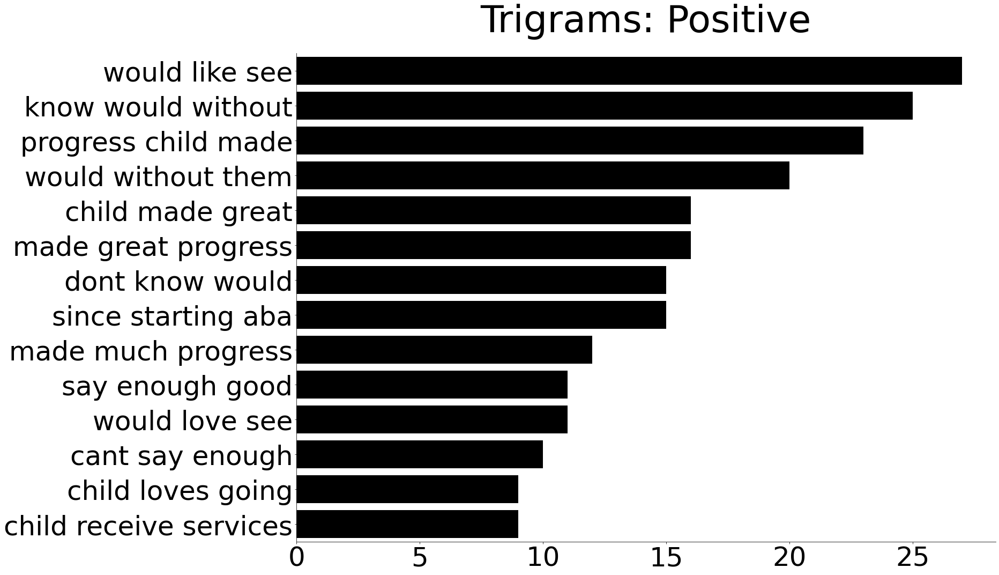

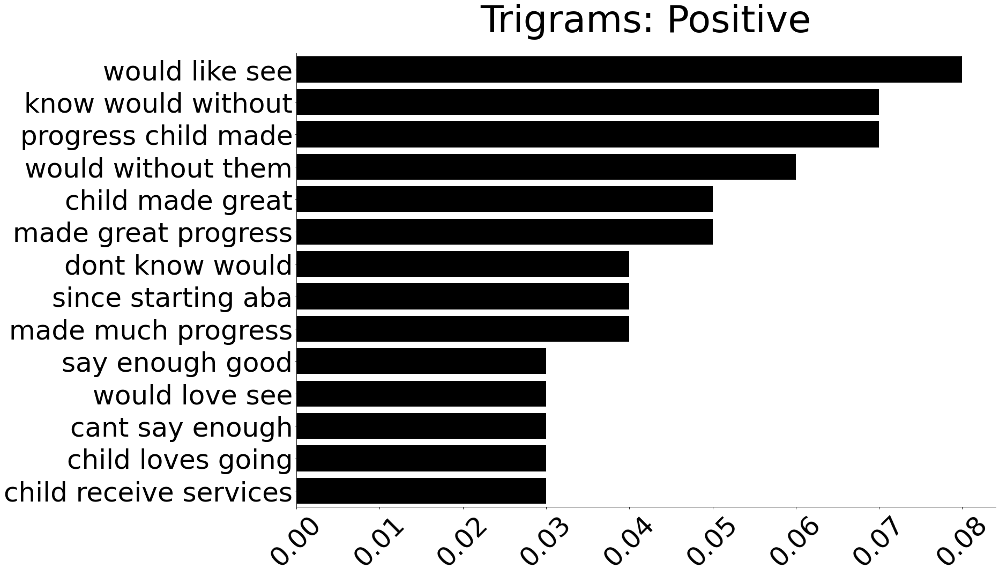



Length:  6153
                           index  count  percent
0    implemented serious changes      4     0.07
1    company implemented serious      4     0.07
2   accredit company implemented      4     0.07
3            child made progress      4     0.07
4         would accredit company      4     0.07
5           psych eval completed      4     0.07
6        child currently receive      3     0.05
7      partner existing facility      3     0.05
8         leaving lack resources      3     0.05
9           lack resources group      3     0.05
10       resources group therapy      3     0.05
11       group therapy desperate      3     0.05
12        therapy desperate need      3     0.05
13         desperate need center      3     0.05
14          needs open something      3     0.05


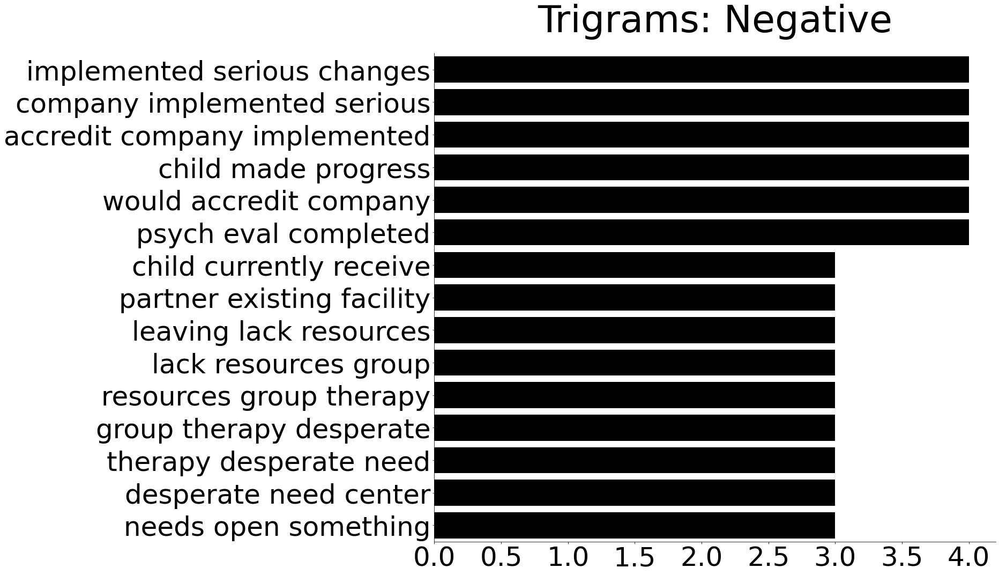

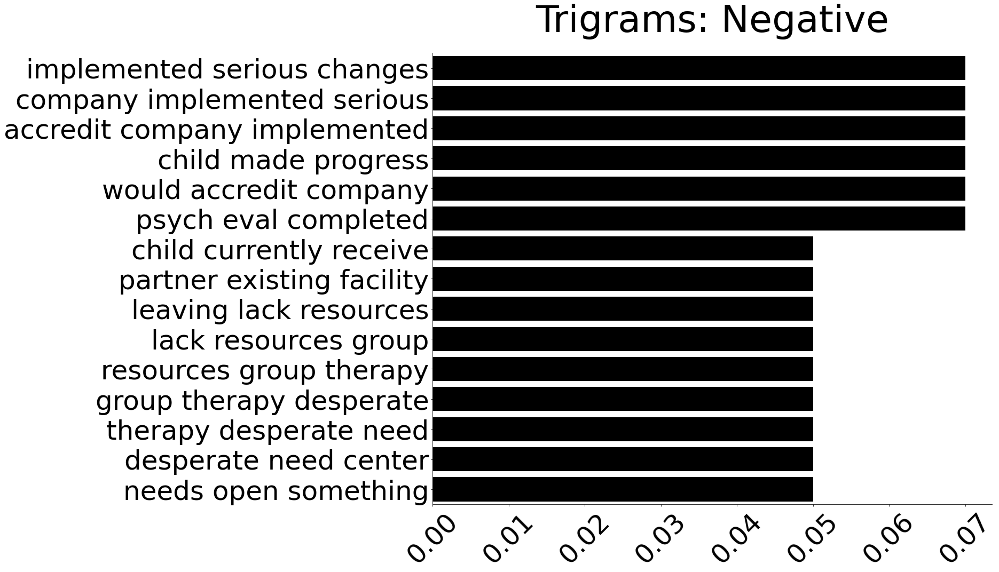

In [24]:
# All Trigrams
ngram_analysis(df=df, ngram_col='trigram_clean', num_n=1, title='Trigrams: Overall', figsize=(26, 15))

# Positive
ngram_analysis(df=pos_df, ngram_col='trigram_clean', num_n=1, title='Trigrams: Positive', figsize=(26, 15))

# Negative
ngram_analysis(df=neg_df, ngram_col='trigram_clean', num_n=1, title='Trigrams: Negative', figsize=(26, 15))

# LDA Topic Modeling

## All Responses

Checking model with 2 topics.
Checking model with 3 topics.
Checking model with 4 topics.
Checking model with 5 topics.
Checking model with 6 topics.
Checking model with 7 topics.
Checking model with 8 topics.
Checking model with 9 topics.
Checking model with 10 topics.


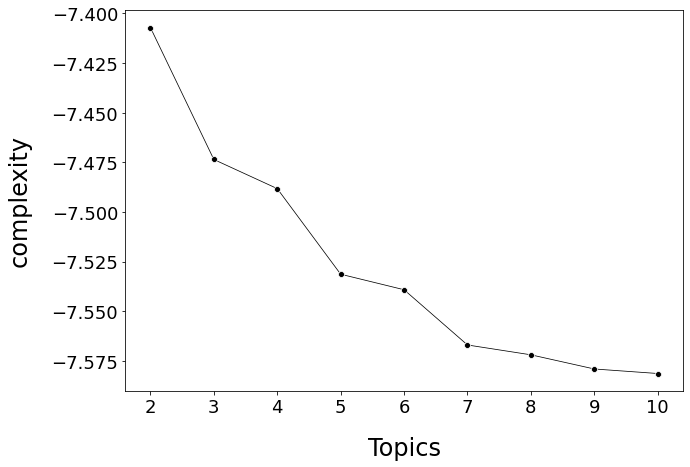

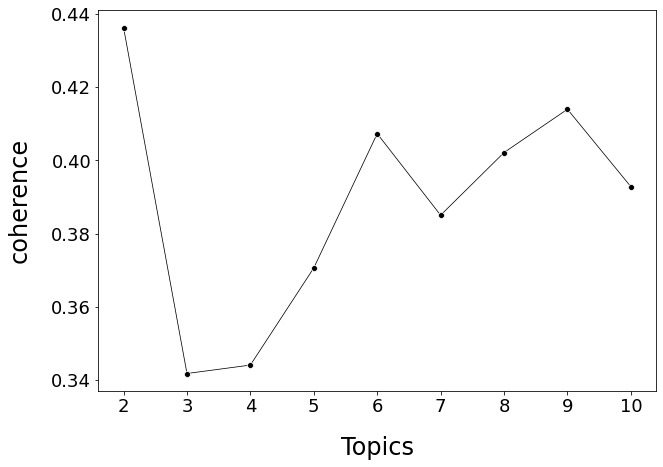

In [25]:
# All responses: LDA Grid
all_lda = lda_model_grid(df=df, col='feedback')
line_plot(df=all_lda, col='complexity', save_name='complexity_all')
line_plot(df=all_lda, col='coherence', save_name='coherence_all')

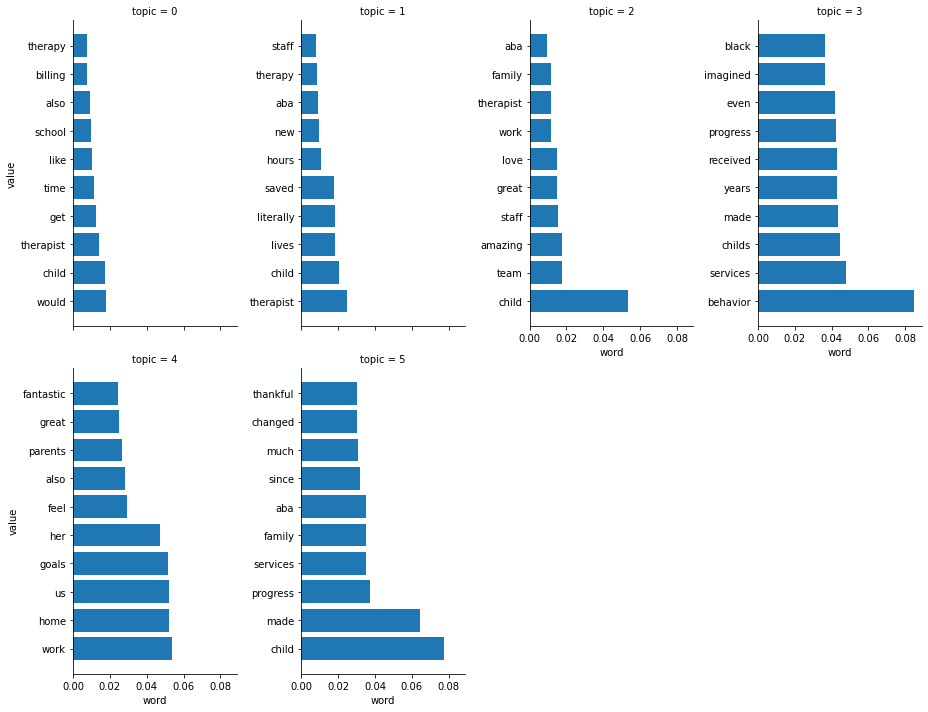

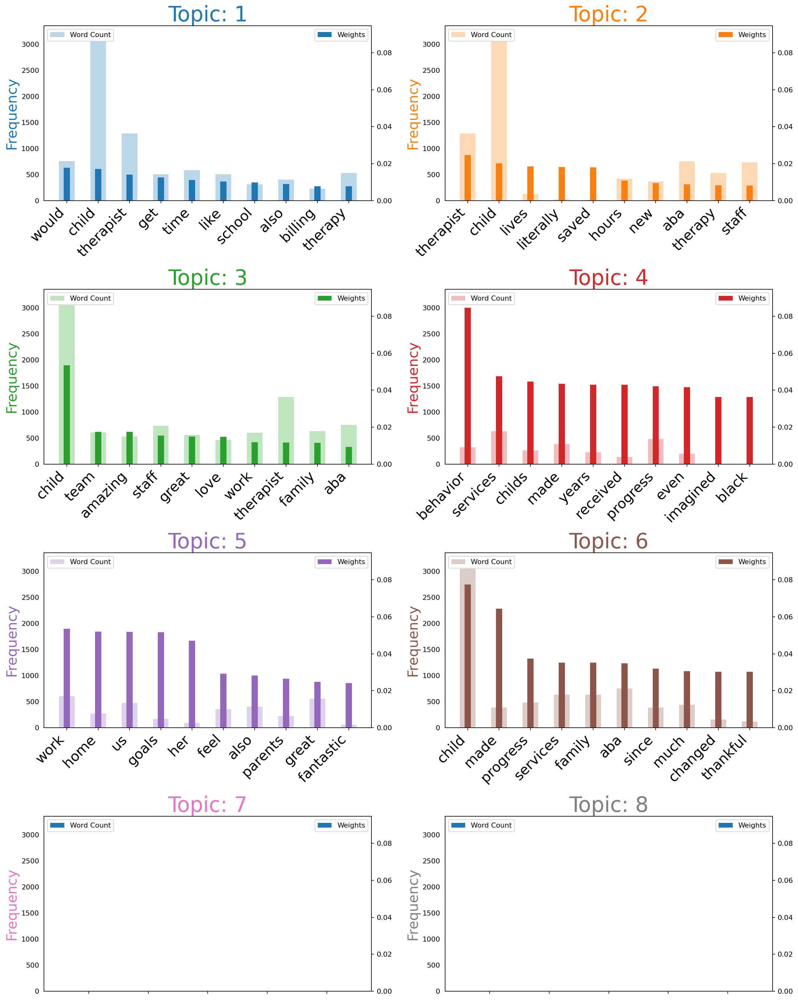

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4830 samples in 0.004s...
[t-SNE] Computed neighbors for 4830 samples in 0.124s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4830
[t-SNE] Computed conditional probabilities for sample 2000 / 4830
[t-SNE] Computed conditional probabilities for sample 3000 / 4830
[t-SNE] Computed conditional probabilities for sample 4000 / 4830
[t-SNE] Computed conditional probabilities for sample 4830 / 4830
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.111801
[t-SNE] KL divergence after 1000 iterations: 0.634957


In [50]:
# All responses: Single Model
all_topics = lda_one_topic(df=df, col='feedback', topics=6, 
                           savename='all_responses', grid_cols=2)

Checking model with 2 topics.
Checking model with 3 topics.
Checking model with 4 topics.
Checking model with 5 topics.
Checking model with 6 topics.
Checking model with 7 topics.
Checking model with 8 topics.
Checking model with 9 topics.
Checking model with 10 topics.


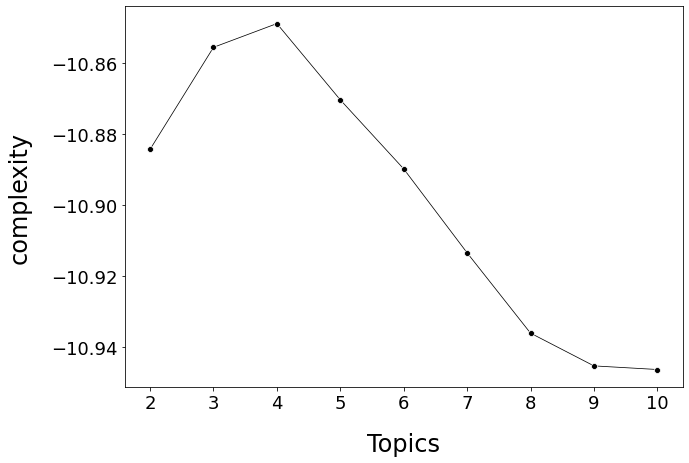

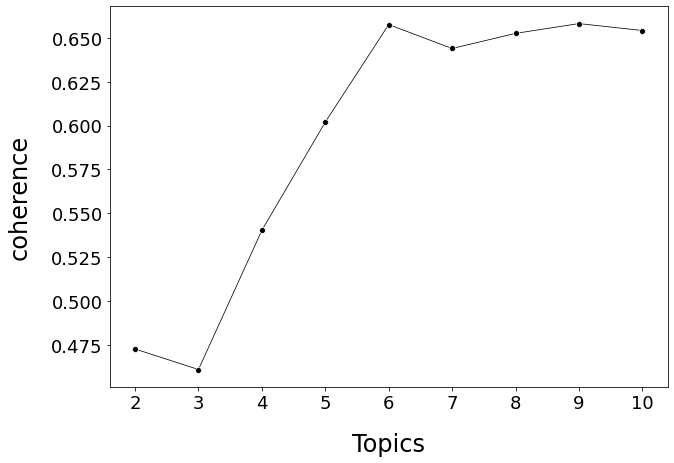

In [27]:
# All responses: Bigrams LDA Grid
all_lda = lda_model_grid(df=df, col='bigrams')
line_plot(df=all_lda, col='complexity', save_name='complexity_all')
line_plot(df=all_lda, col='coherence', save_name='coherence_all')

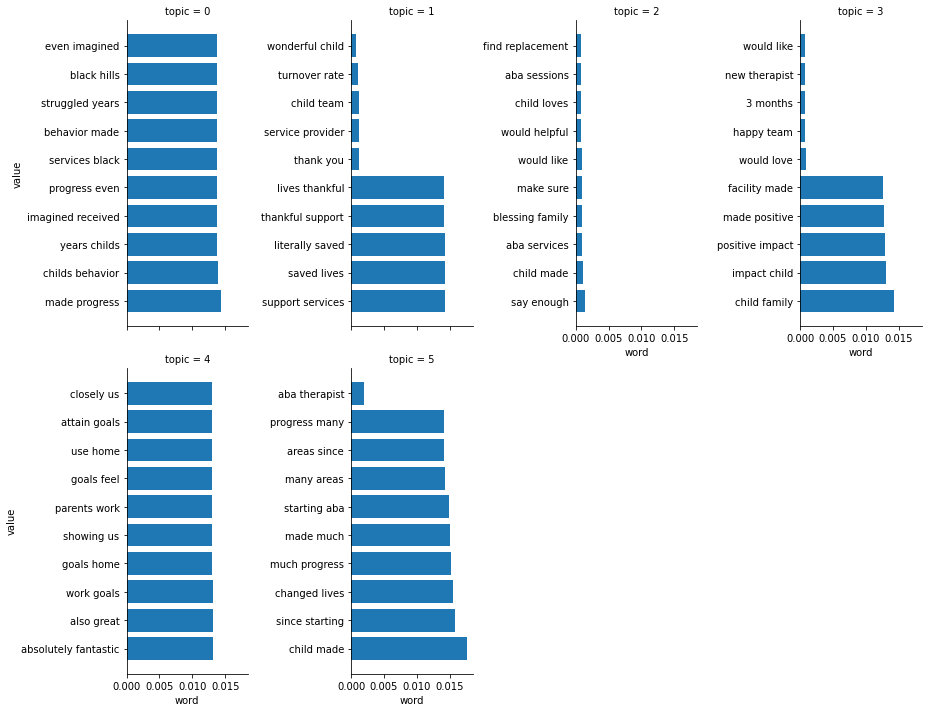

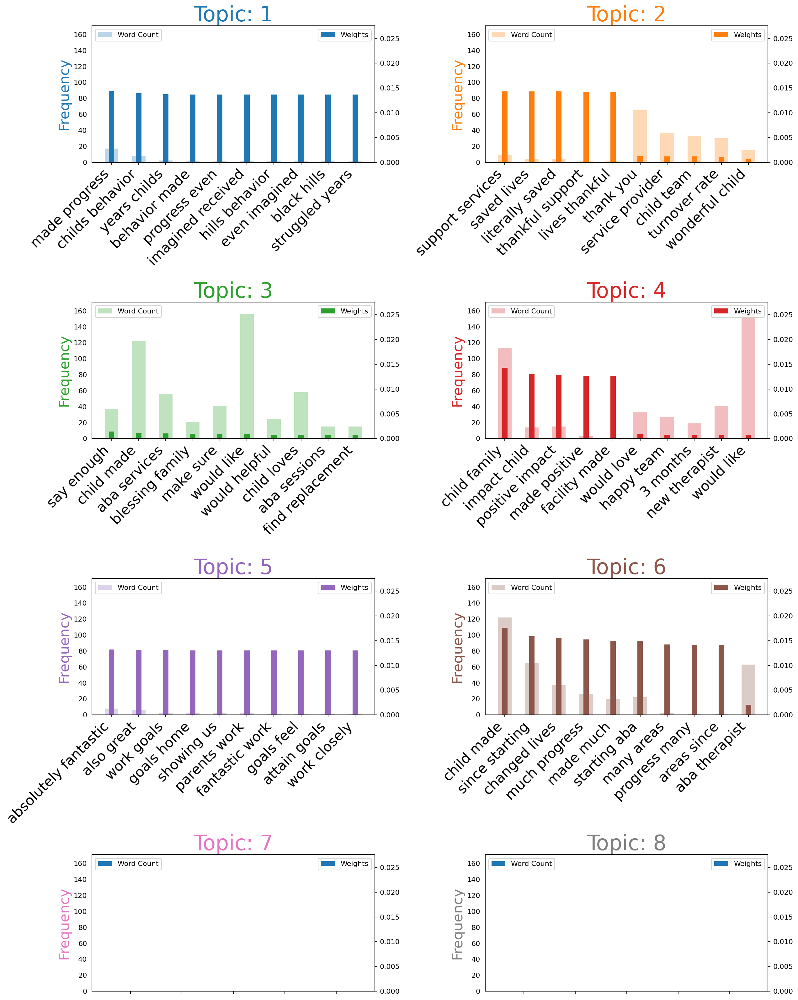

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4699 samples in 0.004s...
[t-SNE] Computed neighbors for 4699 samples in 0.085s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4699
[t-SNE] Computed conditional probabilities for sample 2000 / 4699
[t-SNE] Computed conditional probabilities for sample 3000 / 4699
[t-SNE] Computed conditional probabilities for sample 4000 / 4699
[t-SNE] Computed conditional probabilities for sample 4699 / 4699
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.864239
[t-SNE] KL divergence after 1000 iterations: 0.182406


In [51]:
# All responses: Bigrams single model
all_topics = lda_one_topic(df=df, col='bigrams', topics=6, 
                           savename='all_bigrams', grid_cols=2)

Checking model with 2 topics.
Checking model with 3 topics.
Checking model with 4 topics.
Checking model with 5 topics.
Checking model with 6 topics.
Checking model with 7 topics.
Checking model with 8 topics.
Checking model with 9 topics.
Checking model with 10 topics.


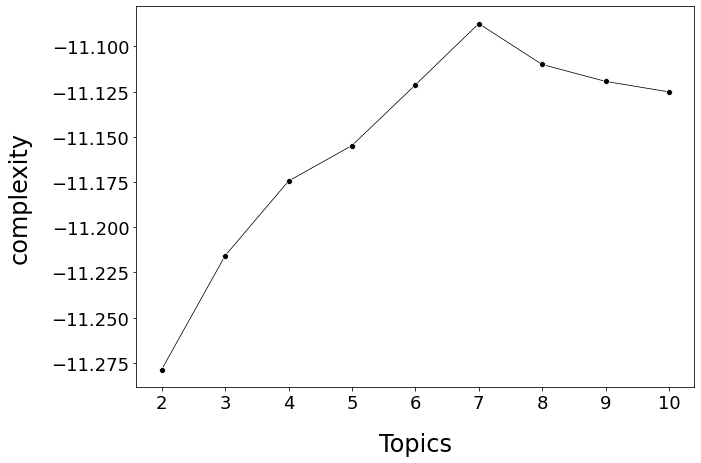

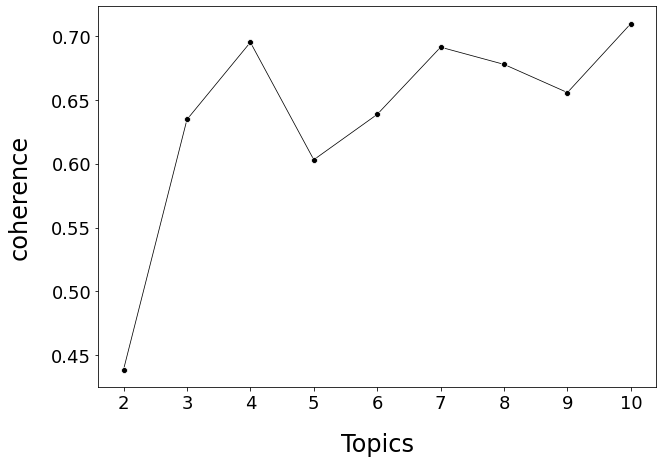

In [29]:
# All responses: Trigrams LDA Grid
all_lda = lda_model_grid(df=df, col='trigrams')
line_plot(df=all_lda, col='complexity', save_name='complexity_all')
line_plot(df=all_lda, col='coherence', save_name='coherence_all')

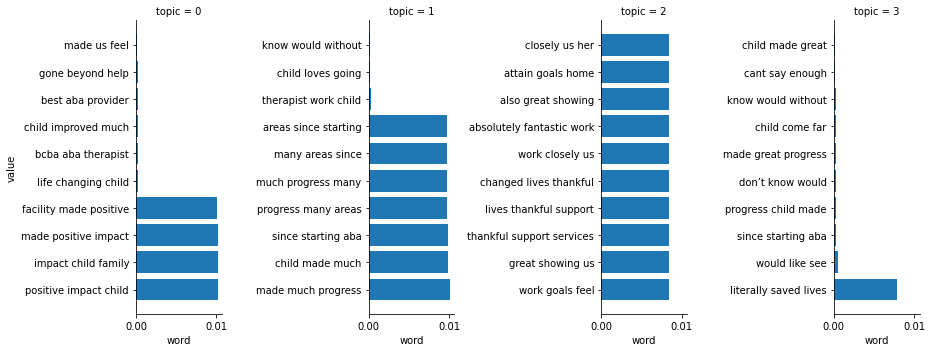

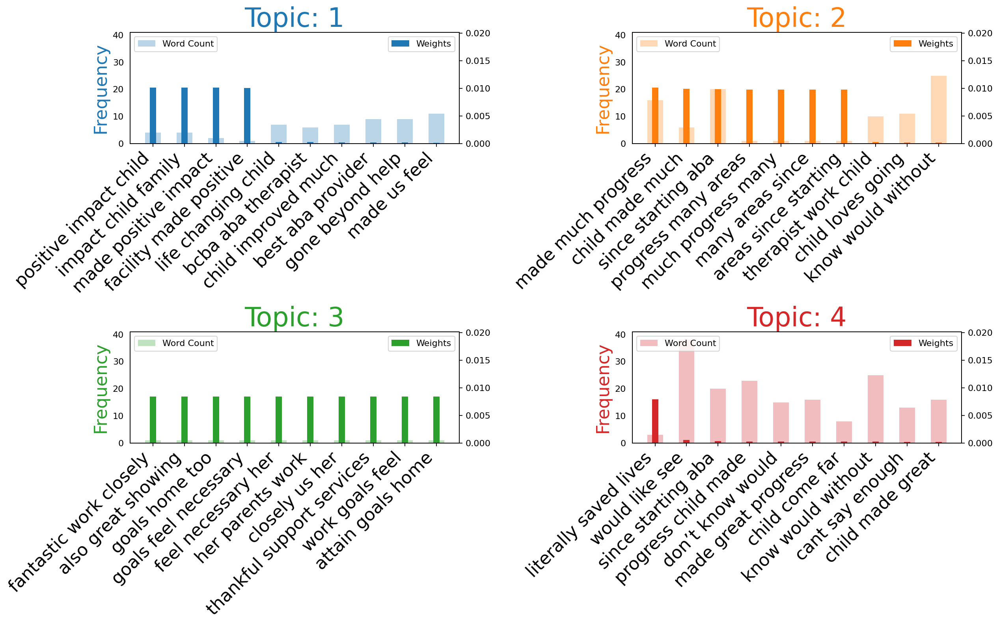

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4549 samples in 0.003s...
[t-SNE] Computed neighbors for 4549 samples in 0.057s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4549
[t-SNE] Computed conditional probabilities for sample 2000 / 4549
[t-SNE] Computed conditional probabilities for sample 3000 / 4549
[t-SNE] Computed conditional probabilities for sample 4000 / 4549
[t-SNE] Computed conditional probabilities for sample 4549 / 4549
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 26.323706
[t-SNE] KL divergence after 1000 iterations: -3.737102


In [52]:
# All responses: Trigrams single model
all_topics = lda_one_topic(df=df, col='trigrams', topics=4, 
                           savename='all_trigrams', grid_cols=2)

## Positive responses

Checking model with 2 topics.
Checking model with 3 topics.
Checking model with 4 topics.
Checking model with 5 topics.
Checking model with 6 topics.
Checking model with 7 topics.
Checking model with 8 topics.
Checking model with 9 topics.
Checking model with 10 topics.


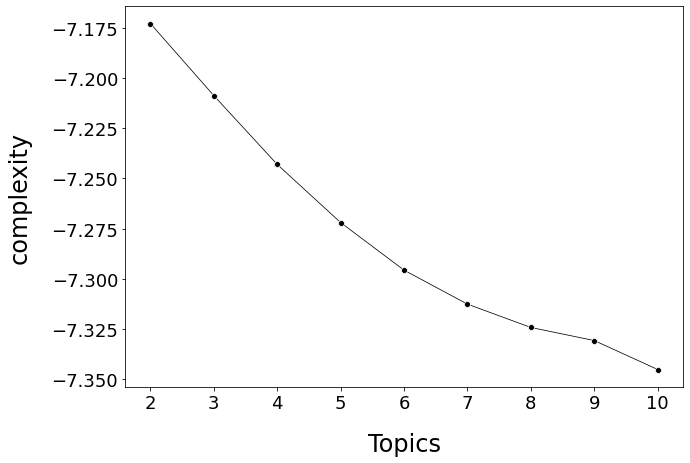

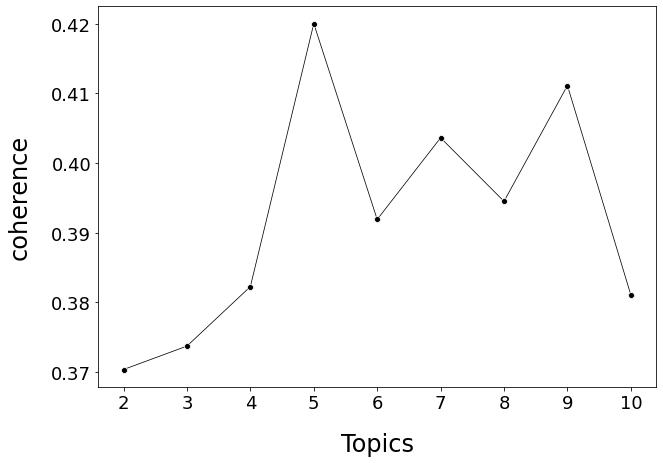

In [31]:
# Positive responses: LDA Grid
pos_20_lda = lda_model_grid(df=pos_df, col='feedback')
line_plot(df=pos_20_lda, col='complexity', save_name='complexity_pos20')
line_plot(df=pos_20_lda, col='coherence', save_name='coherence_pos_20')

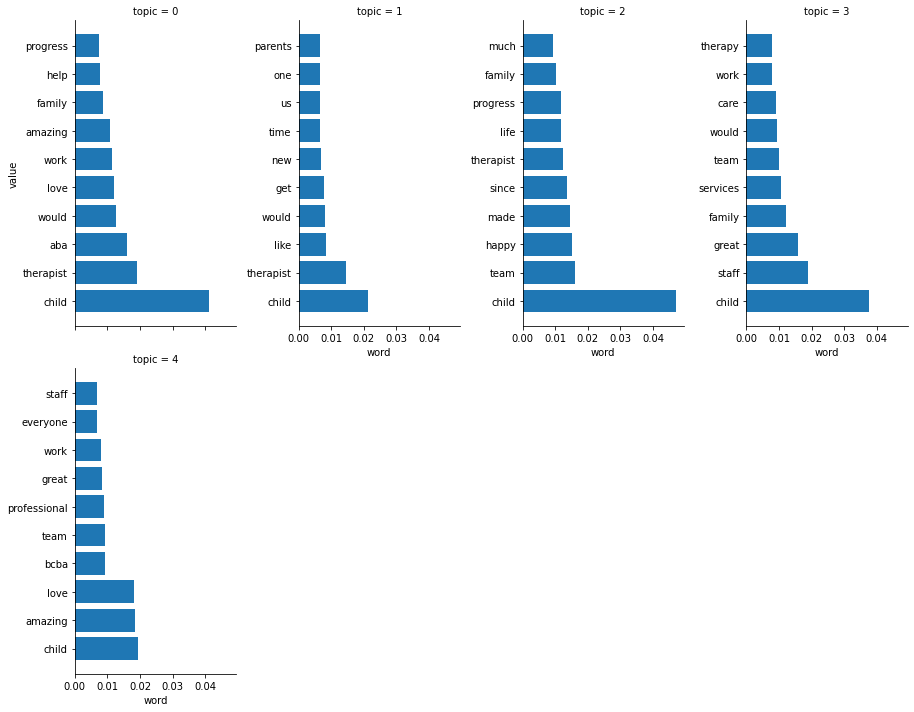

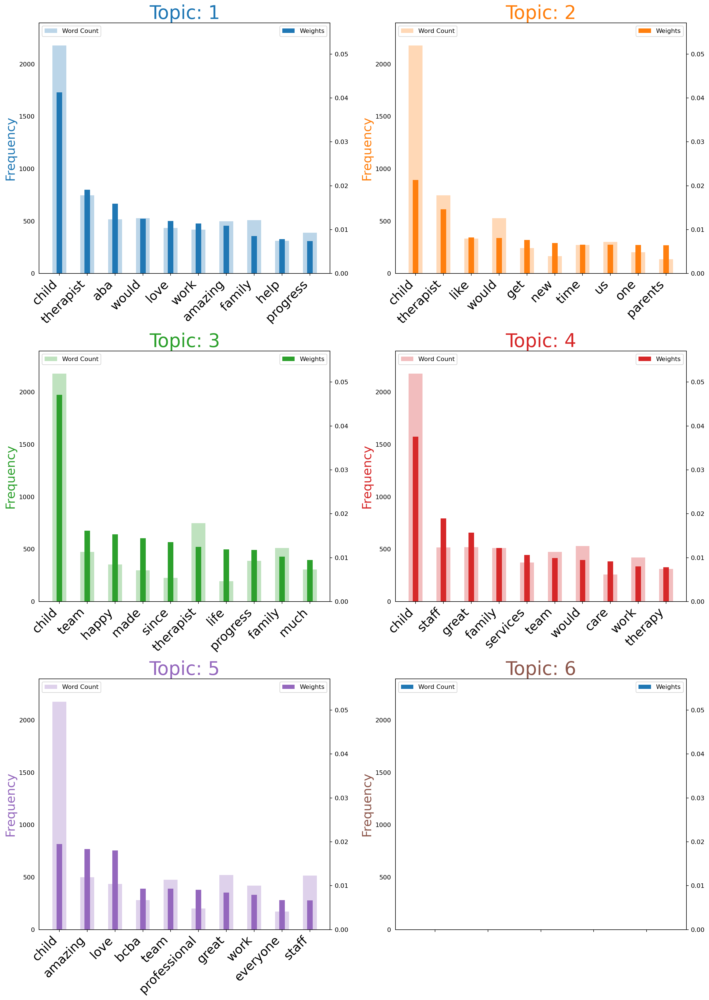

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2931 samples in 0.002s...
[t-SNE] Computed neighbors for 2931 samples in 0.052s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2931
[t-SNE] Computed conditional probabilities for sample 2000 / 2931
[t-SNE] Computed conditional probabilities for sample 2931 / 2931
[t-SNE] Mean sigma: 0.000125
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.845917
[t-SNE] KL divergence after 1000 iterations: 0.284764


In [59]:
# Positive responses: Single model
p20_topics = lda_one_topic(df=pos_df, col='feedback', topics=5, 
                           savename='positive_all', grid_cols=2, fig_height=7.5)

Checking model with 2 topics.
Checking model with 3 topics.
Checking model with 4 topics.
Checking model with 5 topics.
Checking model with 6 topics.
Checking model with 7 topics.
Checking model with 8 topics.
Checking model with 9 topics.
Checking model with 10 topics.


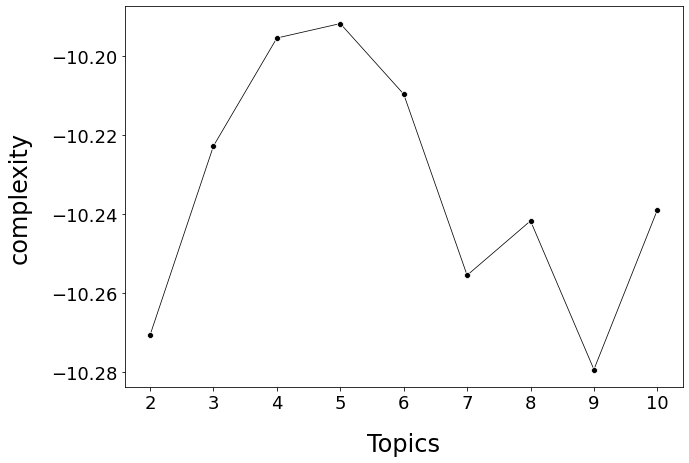

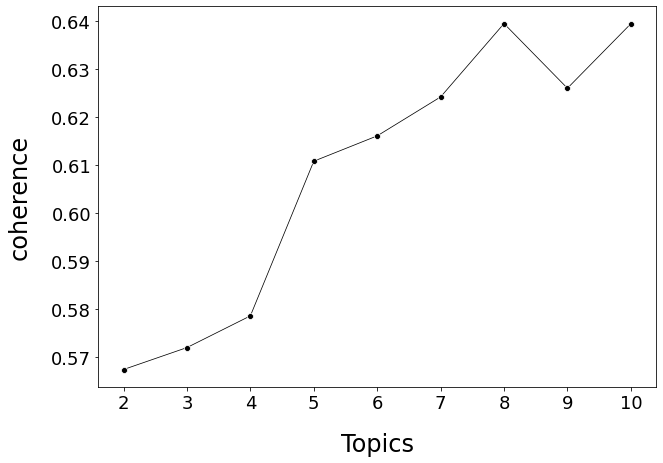

In [33]:
# Positive responses: Bigrams LDA Grid
pos_20_lda = lda_model_grid(df=pos_df, col='bigrams')
line_plot(df=pos_20_lda, col='complexity', save_name='complexity_pos20')
line_plot(df=pos_20_lda, col='coherence', save_name='coherence_pos_20')

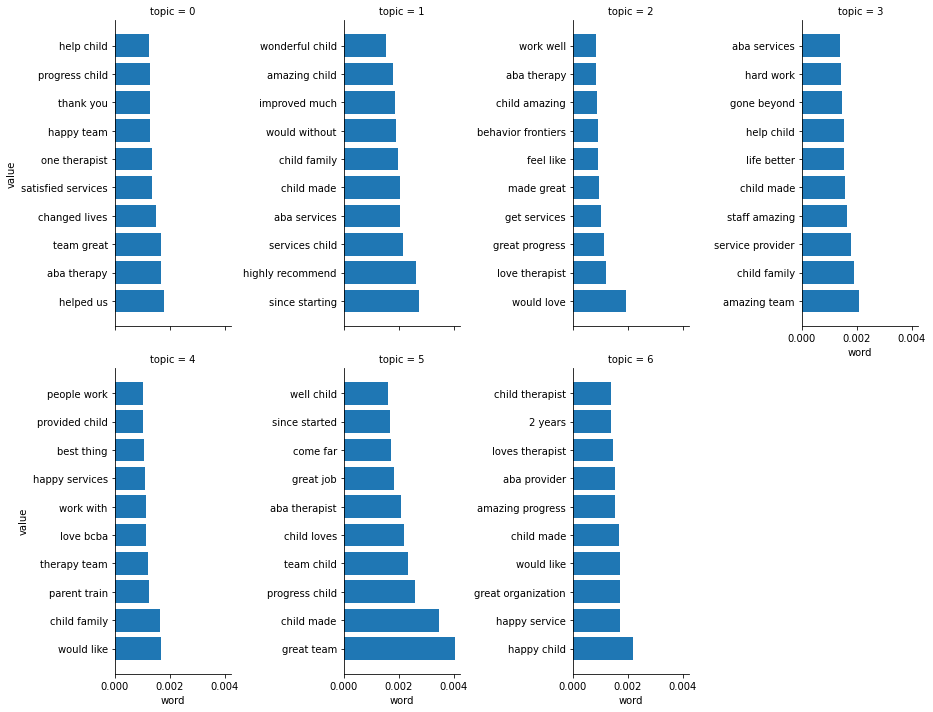

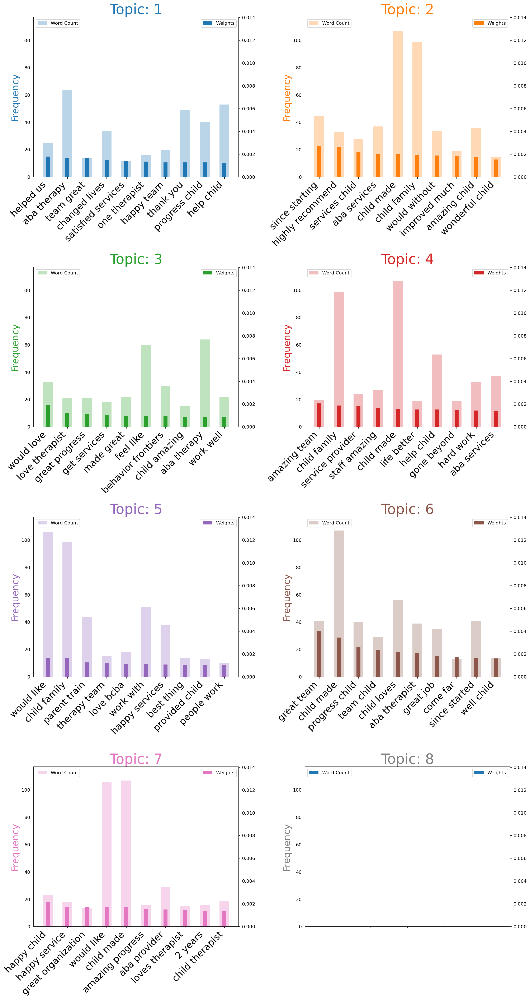

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2918 samples in 0.006s...
[t-SNE] Computed neighbors for 2918 samples in 0.076s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2918
[t-SNE] Computed conditional probabilities for sample 2000 / 2918
[t-SNE] Computed conditional probabilities for sample 2918 / 2918
[t-SNE] Mean sigma: 0.000121
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.248566
[t-SNE] KL divergence after 1000 iterations: 0.076554


In [54]:
# Positive responses: Bigrams single model
p20_topics = lda_one_topic(df=pos_df, col='bigrams', topics=7, 
                           savename='positive_bigrams', grid_cols=2, fig_height=6)

Checking model with 2 topics.
Checking model with 3 topics.
Checking model with 4 topics.
Checking model with 5 topics.
Checking model with 6 topics.
Checking model with 7 topics.
Checking model with 8 topics.
Checking model with 9 topics.
Checking model with 10 topics.


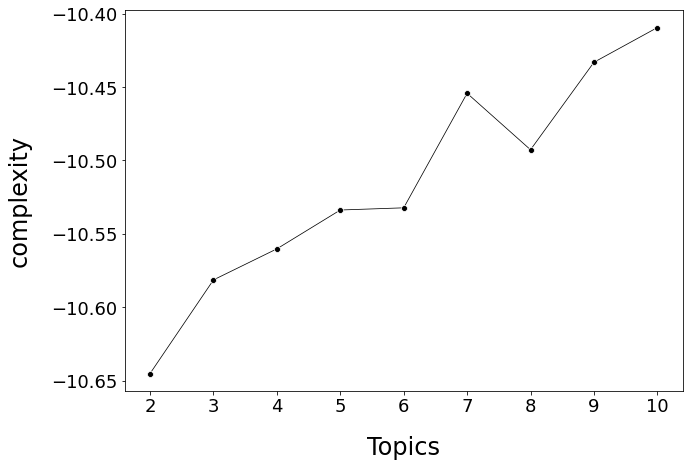

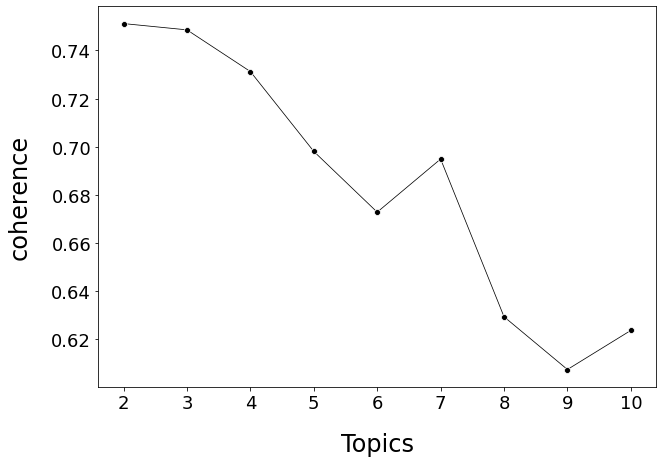

In [35]:
# Positive responses: Trigrams LDA Grid
pos_20_lda = lda_model_grid(df=pos_df, col='trigrams')
line_plot(df=pos_20_lda, col='complexity', save_name='complexity_pos20')
line_plot(df=pos_20_lda, col='coherence', save_name='coherence_pos_20')

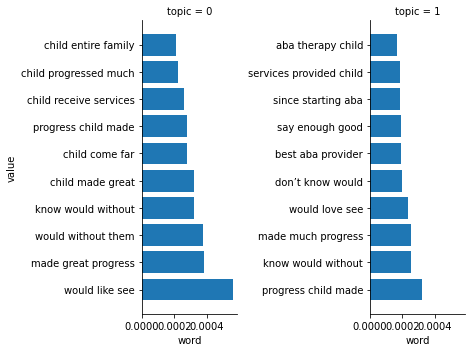

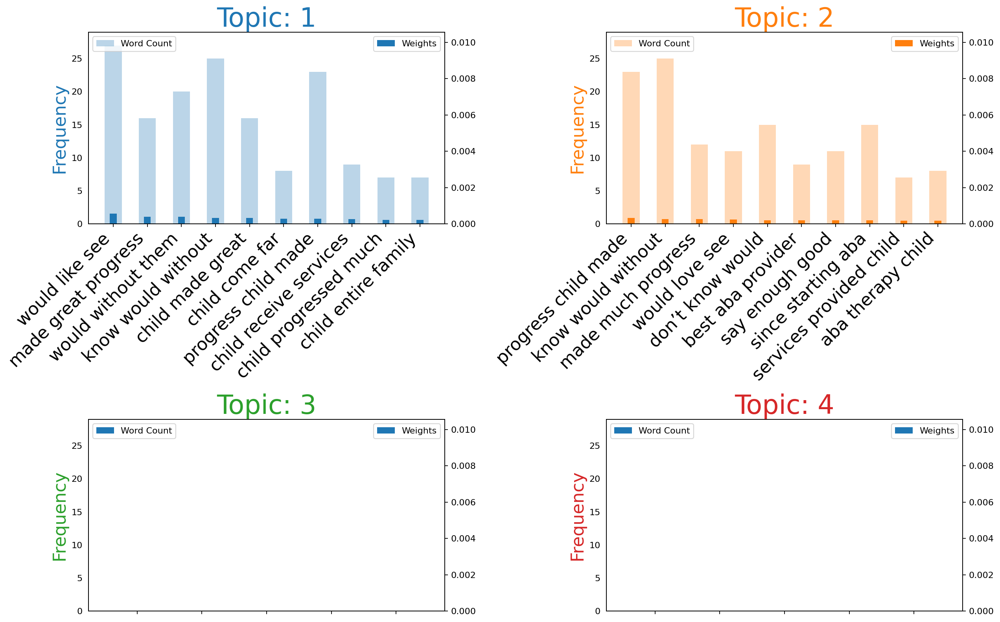

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2940 samples in 0.001s...
[t-SNE] Computed neighbors for 2940 samples in 0.049s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2940
[t-SNE] Computed conditional probabilities for sample 2000 / 2940
[t-SNE] Computed conditional probabilities for sample 2940 / 2940
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 14.296004
[t-SNE] KL divergence after 1000 iterations: -5.311450


In [55]:
# Positive responses: Trigrams single model
p20_topics = lda_one_topic(df=pos_df, col='trigrams', topics=2, 
                           savename='positive_trigrams', grid_cols=2)

## Negative responses

Checking model with 2 topics.
Checking model with 3 topics.
Checking model with 4 topics.
Checking model with 5 topics.
Checking model with 6 topics.
Checking model with 7 topics.
Checking model with 8 topics.
Checking model with 9 topics.
Checking model with 10 topics.


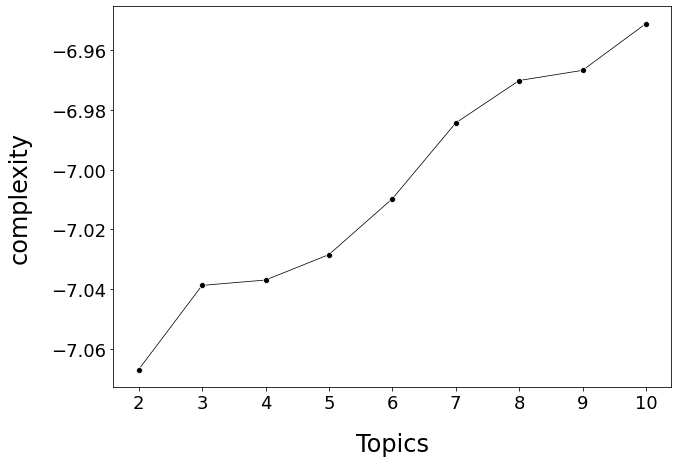

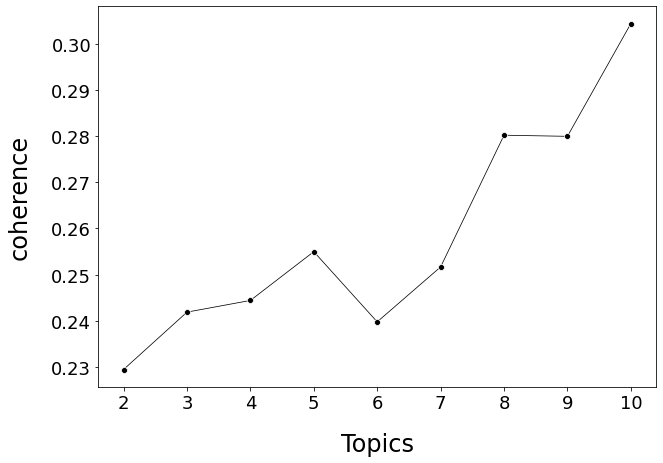

In [37]:
# Negative responses: LDA Grid
neg_20_lda = lda_model_grid(df=neg_df, col='feedback')
line_plot(df=neg_20_lda, col='complexity', save_name='complexity_neg_20')
line_plot(df=neg_20_lda, col='coherence', save_name='coherence_neg_20')

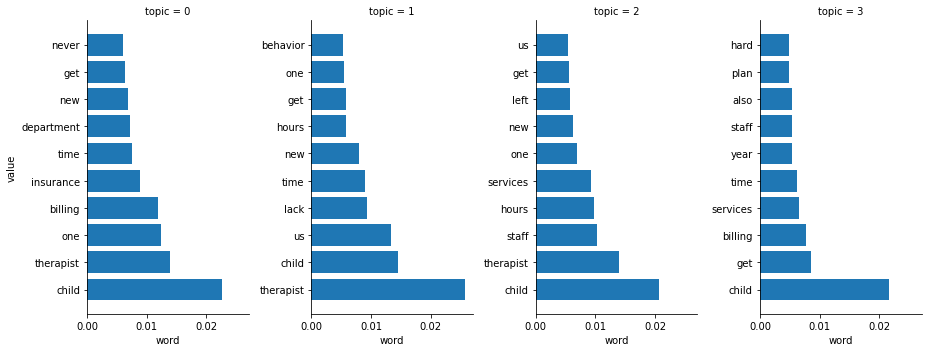

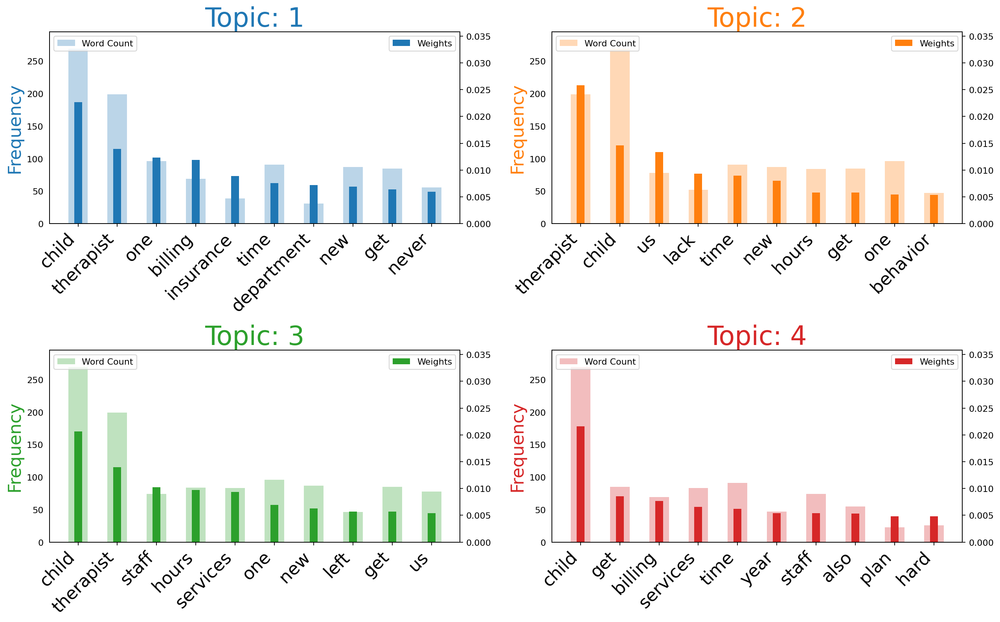

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 261 samples in 0.000s...
[t-SNE] Computed neighbors for 261 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 261 / 261
[t-SNE] Mean sigma: 0.000687
[t-SNE] KL divergence after 250 iterations with early exaggeration: 47.960503
[t-SNE] KL divergence after 1000 iterations: -0.046201


In [56]:
# Negative responses: Single model
p21_topics = lda_one_topic(df=neg_df, col='feedback', topics=4, 
                           savename='negative_bigrams', grid_cols=2)

Checking model with 2 topics.
Checking model with 3 topics.
Checking model with 4 topics.
Checking model with 5 topics.
Checking model with 6 topics.
Checking model with 7 topics.
Checking model with 8 topics.
Checking model with 9 topics.
Checking model with 10 topics.


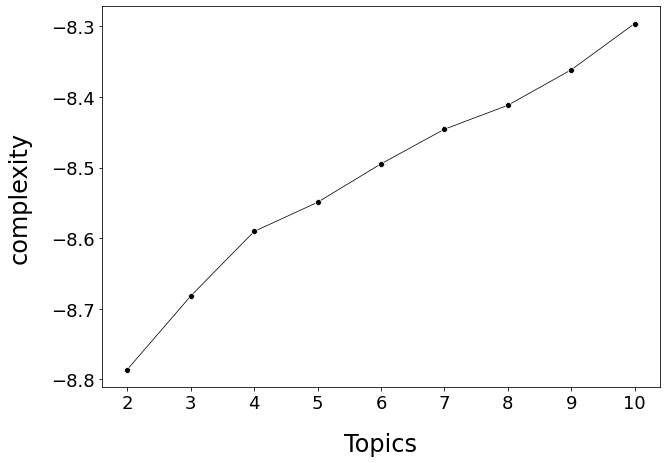

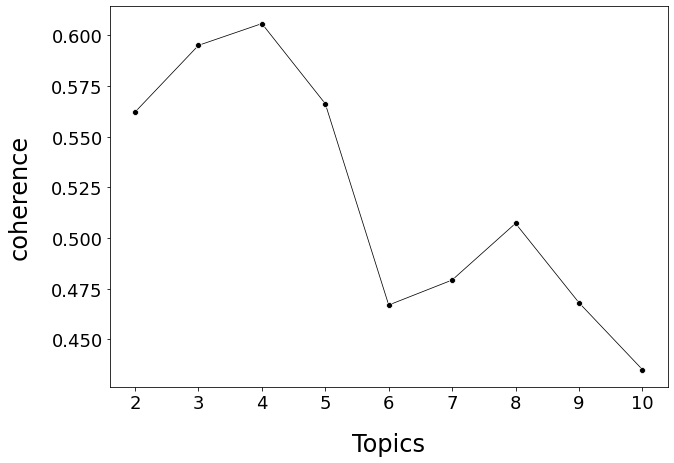

In [39]:
# Negative responses: Bigrams LDA Grid
neg_20_lda = lda_model_grid(df=neg_df, col='bigrams')
line_plot(df=neg_20_lda, col='complexity', save_name='complexity_neg_20')
line_plot(df=neg_20_lda, col='coherence', save_name='coherence_neg_20')

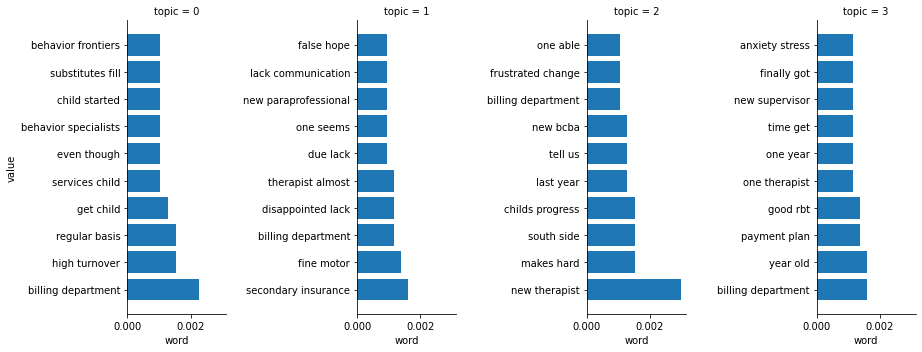

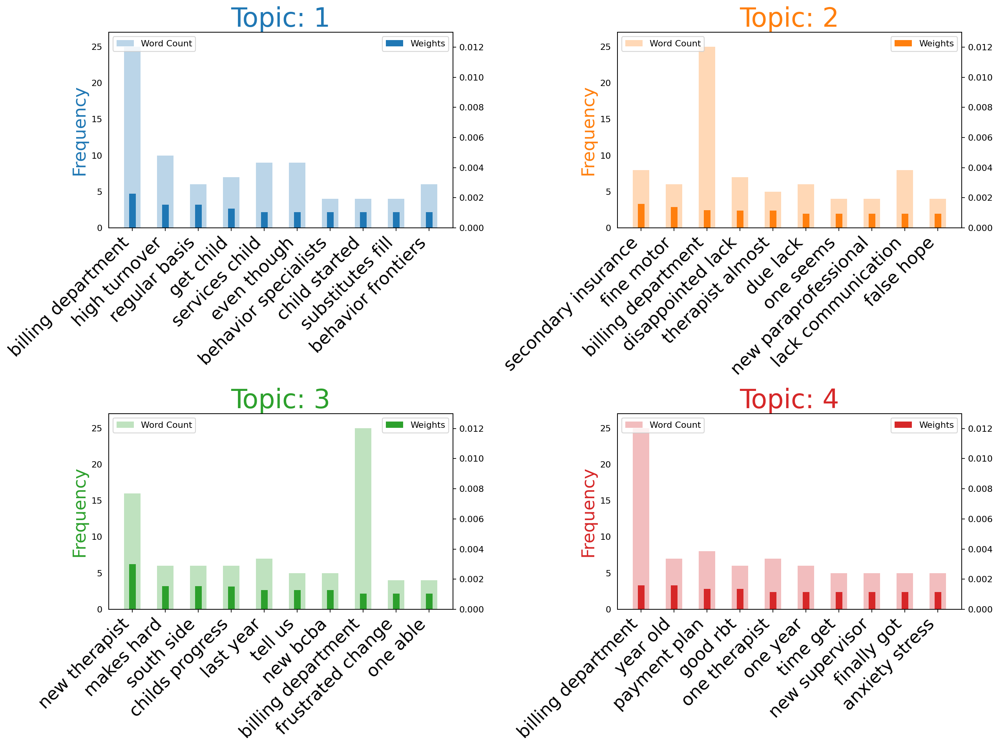

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 261 samples in 0.000s...
[t-SNE] Computed neighbors for 261 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 261 / 261
[t-SNE] Mean sigma: 0.000658
[t-SNE] KL divergence after 250 iterations with early exaggeration: 49.302040
[t-SNE] KL divergence after 1000 iterations: -0.083529


In [61]:
# Negative responses: Bigrams single model
p21_topics = lda_one_topic(df=neg_df, col='bigrams', topics=4, 
                           savename='negative_bigrams', grid_cols=2, fig_height=6)

Checking model with 2 topics.
Checking model with 3 topics.
Checking model with 4 topics.
Checking model with 5 topics.
Checking model with 6 topics.
Checking model with 7 topics.
Checking model with 8 topics.
Checking model with 9 topics.
Checking model with 10 topics.


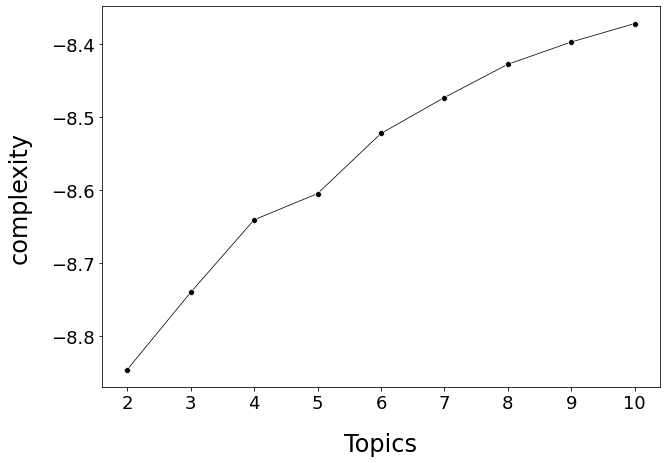

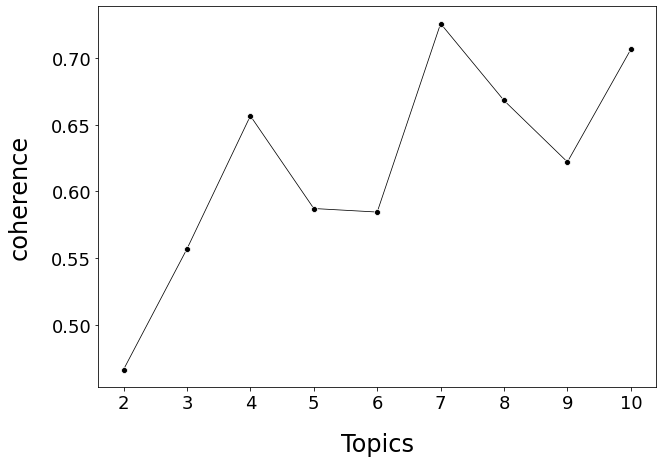

In [41]:
# Negative responses: Trigrams LDA Grid
neg_20_lda = lda_model_grid(df=neg_df, col='trigrams')
line_plot(df=neg_20_lda, col='complexity', save_name='complexity_neg_20')
line_plot(df=neg_20_lda, col='coherence', save_name='coherence_neg_20')

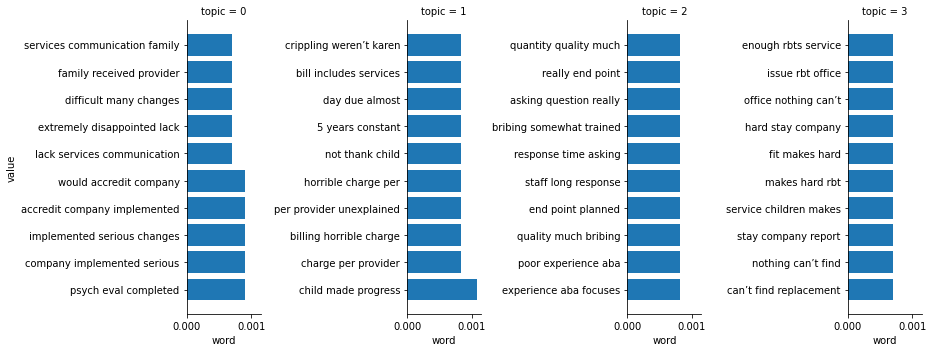

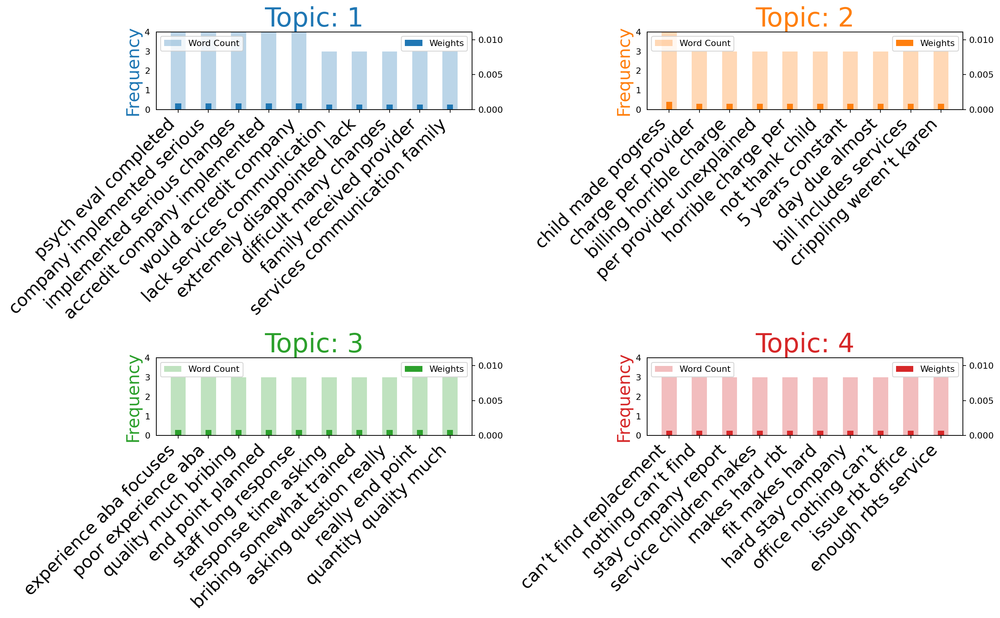

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 259 samples in 0.000s...
[t-SNE] Computed neighbors for 259 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 259 / 259
[t-SNE] Mean sigma: 0.000718
[t-SNE] KL divergence after 250 iterations with early exaggeration: 49.899746
[t-SNE] KL divergence after 1000 iterations: -0.058288


In [58]:
# Negative responses: Trigrams single model
p21_topics = lda_one_topic(df=neg_df, col='trigrams', topics=4, 
                           savename='negative_trigrams', grid_cols=2)